# BACKTEST & TEST FOR ROBUSTNESS A MOMENTUM STRATEGY

# Summary

- GOAL
- IMPORT LIBRARIES
- DATAS
    - Import data
    - Put each ticker's dataframe into a single dataframe
- SEPARATE THE TRAIN SET INTO IN SAMPLE & OUT OF SAMPLE PERIODS
- DEFINE THE INDICATORS
- DEFINE A FUNCTION FOR GENERATING SIGNALS
- DEFINE THE TRADING RULES
- DEFINE A MARKET SIMULATOR TO SIMULATE SLIPPAGE & COMMISSIONS
- RUN A BACKTEST ON TRAIN TEST TO CHECK IF THE MODEL BEHAVE AS IT SHOULD
     - Look at orders generated
     - Look graphically if it is behaving as expected
     - Look at what happened under the hood (PnLs, positions, quantities...)
- ROBUSTNESS TESTING
    - Optimisation       
        - Separate the train set into 5 subsets
        - Optimise on each subset
        - Extract the 20 combinations who have the best average sharpe across the 5 subsets
    - Sensitivity analysis
        - Verify that the 20 best combinations are localized in specific clusters
        - Pick randomly one combination in each cluster
    - Cross-validation
        - Test the selected combinations and see how they perform as an equal weight portfolio on training data
        - Test the selected combinations and see how they perform as an equal weight portfolio on testing data
    - Check if the 20 best combinations from best clusters behave similarly as the randomly selected combinations
    - Test statistical significance (Generate bootstrapped samples from the out of sample returns timeseries)
        - Check if the portfolio has a positive PnL at the 95% confidence interval
        - Check if the portfolio beats the benchmark's sharpe at the 95% confidence interval

- PERFORMANCES ON TEST SET (EQUITY CURVE + METRICS)
- CONCLUSION


# Goal

Backtest a simple alpha and determine if it is robust enough to be added to the portfolio.

If robust enough, add it to the portfolio to see if it add value

# Strategy's description

LIBRARY FOR BACKTESTIN\
pyqstrat


LONG ENTRY RULE\
When ROC (rate of change) is above a certain threshold and close is above sma200

LONG EXIT RULE\
When ROC is below the threshold or close below sma200

ASSET CLASS\
Equities

UNIVERSE\
30 high-volatility stocks containing positive auto-correlation in their timeseries

COMMISSIONS\
Included in the model (Interactive brokers commissions scheme)\
Impact of commissions on the performance decreased with the amount oof capital traded

SLIPPAGE\
Not included in the model

SIDE\
Long only

STOP LOSS\
NO

TAKE PROFIT\
NO

TIME BASED EXIT\
NO

ALLOCATION\
When equity is >= starting capital\
=> Allocation = starting equity * (1/number of assets)

When equity is < starting capital\
=> Allocation = current equity * (1/number of assets)

In both cases, commissions are substracted from the dollar amount to buy, and then the number of shares to buy is re-calculated using this newly calculated dollar amount of allocation. This way, the dollar amount bought is never superior to the required allocation

EXECUTION\
The presence of a signal is checked after the close of each day
If a trade has to be taken, it is executed at the next day's open with a market order
    
When equity is >= starting capital\
In this backtest, the number of shares to buy is calculated using the next day's open price, because in live trading, the number of shares bought will be calculated using the next day's open price, since we won't buy at the  at the close but at the next day's open

When equity is < starting capital\
In this backtester, to check if the equity is < starting capital, the equity at the close is used for calculating the allocation, whereas we would need the equity value at the next day's open to make the appropriate calculation.

Indeed, there will most likely have a change in equity value between the close in t and the next day's open in t+1, in which case:

1.The equity decreased:\
=> the backtest will make us buy more shares than what we would have calculated if we had been able to know  the equity value at the open.

2.The equity increased:\
=> the backtest will make us buy less shares than what we would have calculated if we had been able to know the equity value at the open

===> Because of that, there is a slight discrepancy between the results of this backtest and the results we would have had in live trading

Tips for solving this problem:\
1.Calculate ourselves the equity value at the next day's open by extracting the trade value of each ticker and update these values using the next day's open price\
=> Take a look at account.position(contract_group, timestamp) in the documentation

2.Simulate execution of trades at the close by constructing a daily bar using one minute bars during the backtest\
Cons:\
Because our conditions for a signal can be checked only when the close price is printed, we can't place a trade at the close price since it is already printed\
To be able to execute on the close price, we would need to backtest with one minute data, construct a daily bar with all the one minute bars of the day except the last one, check our conditions on this created bar, and then execute at the open of the last minute bar.\
The problem is that it will drastically slow down our backtest

Pros:\
We will be able to calculate the allocation perfectly since there won't be any discrepancy between the equity value at the close of the bar before the last bar of the day and the open of the last bar of the day.



# Import libraries

In [1]:
'''For data handling'''
import pandas as pd
import numpy as np

'''For creating indicators'''
import talib

'''To ignore warnings'''
import warnings
warnings.filterwarnings('ignore')

'''For special cases'''
import math
from datetime import datetime
import pathlib
import random

'''For backtesting'''
import pyqstrat as pq
pq.set_defaults()
from types import SimpleNamespace

'''For plotting'''
import matplotlib.pyplot as plt

'''For clustering'''
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# Import data

In [2]:
# Define a path toward the directory containing the csv files of each ticker
path = '/Path/toward/your/csv_file/'

# Extract the tickers names and store them into a variable
selected_tickers = [filename.stem for filename in pathlib.Path(path).glob('*.csv')]
print(len(selected_tickers))
print(selected_tickers)

30
['ISRG', 'CE', 'BBY', 'LVS', 'C', 'MGM', 'F', 'DXCM', 'MOS', 'DHI', 'AMD', 'URI', 'VLO', 'RF', 'MPWR', 'NFLX', 'LEN', 'FITB', 'ILMN', 'AAL', 'FFIV', 'RCL', 'LYV', 'ON', 'PHM', 'MS', 'AIG', 'TTWO', 'WYNN', 'MU']


In [3]:
prices = []

# Iterate through the list of symbols to import their respective ohlc datas and to rename the columns of 
# their dataframes. Store the dataframes into the empty list 'prices'
for symbol in selected_tickers:
    
    df = pd.read_csv(f'{path}/{symbol}.csv')[['Date','Open','High','Low','Close']] # Import data into a dataframe
    df = df.set_index('Date')  # Use the column Date as index
    df.columns = [f'{symbol}_o', f'{symbol}_h', f'{symbol}_l', f'{symbol}_c'] # Rename columns
    prices.append(df) # Store the dataframes into the list 'prices'
    
prices_df = pd.concat(prices, axis=1, sort=True) # Concatenate the dataframes to have a single dataframe
prices_df['timestamp'] = pd.to_datetime(prices_df.index.values) # Create a column 'timestamp' with date values 
prices_df = prices_df.set_index('timestamp') # Set as index the column 'timestamp'
timestamps = prices_df.index.values # store the index values for a later use in this notebook

prices_df = prices_df.dropna(axis=1) # Remove tickers who were not traded during all the length of the dataset
prices_df

,ISRG_o,ISRG_h,ISRG_l,ISRG_c,CE_o,CE_h,CE_l,CE_c,BBY_o,BBY_h,BBY_l,BBY_c,LVS_o,LVS_h,LVS_l,LVS_c,C_o,C_h,C_l,C_c,MGM_o,MGM_h,MGM_l,MGM_c,F_o,F_h,F_l,F_c,DXCM_o,DXCM_h,DXCM_l,DXCM_c,MOS_o,MOS_h,MOS_l,MOS_c,DHI_o,DHI_h,DHI_l,DHI_c,AMD_o,AMD_h,AMD_l,AMD_c,URI_o,URI_h,URI_l,URI_c,VLO_o,...,FITB_c,ILMN_o,ILMN_h,ILMN_l,ILMN_c,AAL_o,AAL_h,AAL_l,AAL_c,FFIV_o,FFIV_h,FFIV_l,FFIV_c,RCL_o,RCL_h,RCL_l,RCL_c,LYV_o,LYV_h,LYV_l,LYV_c,ON_o,ON_h,ON_l,ON_c,PHM_o,PHM_h,PHM_l,PHM_c,MS_o,MS_h,MS_l,MS_c,AIG_o,AIG_h,AIG_l,AIG_c,TTWO_o,TTWO_h,TTWO_l,TTWO_c,WYNN_o,WYNN_h,WYNN_l,WYNN_c,MU_o,MU_h,MU_l,MU_c
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2006-01-03,13.21,13.21,12.5433331,12.8666668,19.3500004,19.8400002,18.8999996,19.7700005,43.75,44.9900017,43.4500008,44.7299995,39.7200012,39.7400017,38.4399986,38.6800003,490,493.799988,481.100006,492.899994,36.9500008,37.2000008,35.6199989,36.9300003,7.71999979,7.82999992,7.65999985,7.82999992,3.74749994,3.74749994,3.625,3.625,14.6400003,15,14.6400003,15,36.4599991,37.1199989,35.2000008,36.9399986,31.0200005,32.5800018,30.8799992,32.4000015,23.5900002,23.8700008,23.0699997,23.8199997,48.0347366,...,37.8699989,7.125,7.40500021,6.875,7.40500021,37.2000008,38.2799988,36.8499985,37.4500008,28.8549995,31.2000008,28.3500004,30.8950005,45.4799995,45.4799995,44.3300018,44.9599991,12.8999996,13.5,12.8100004,13.5,5.53999996,5.76999998,5.53999996,5.76999998,39.5,41.4599991,39.5,41.2400017,57.1699982,58.4900017,56.7400017,58.3100014,1378.80005,1393.19995,1336.80005,1392.40002,17.7000008,18.1900005,17.7000008,18.0499992,54.8499985,54.9900017,52.6399994,53.9500008,13.4799995,13.6000004,13.3400002,13.5100002
2006-01-04,12.914444,13.5644436,12.8888893,13.5622215,19.7700005,19.9500008,19.4500008,19.7999992,44.5999985,44.6100006,43.6300011,44.0499992,38.7999992,40.5900002,38.75,40.0900002,488.600006,491,483.5,483.799988,36.9300003,36.9300003,35.8800011,35.9799995,7.82999992,8.07999992,7.82000017,8.01000023,3.66000009,3.95000005,3.6500001,3.8125,15.0100002,15.25,15.0100002,15.1999998,36.8300018,36.8400002,36.3400002,36.6399994,32.5,33.0999985,32.4500008,32.5600014,23.8199997,23.9400005,23.5200005,23.7399998,48.9945145,...,38.3400002,7.40500021,7.79500008,7.28000021,7.6500001,37.7000008,40.5999985,37.7000008,39.2000008,31.0249996,32,30.6450005,31.8649998,45.1899986,45.2999992,44.3800011,44.7999992,13.4700003,13.8500004,13,13,5.78000021,5.86999989,5.76000023,5.76999998,41.2400017,41.4300003,40.5299988,40.8899994,58.7000008,59.2799988,58.3499985,58.3499985,1395.80005,1407,1385.19995,1394.40002,18.1499996,18.1800003,17.6000004,17.8099995,53.7599983,54.1699982,52.4399986,53.8499985,13.75,14.1400003,13.6400003,14.0500002
2006-01-05,13.7755556,13.7777777,13.3055563,13.3644438,19.7999992,19.9599991,19.4500008,19.7700005,44.0999985,44.5,43.3199997,43.5,40.0999985,40.7700005,40.0999985,40.5299988,484.399994,487.799988,484,486.200012,36.3499985,36.4000015,35.5999985,35.75,8.05000019,8.39999962,8.02999973,8.35000038,3.85750008,3.96000004,3.7874999,3.95000005,15.1599998,15.5900002,15.1099997,15.4899998,36.4000015,37.9799995,36.4000015,37.3699989,32.5099983,33.9399986,32.5099983,33.6800003,23.6700001,23.8999996,23.5699997,23.8400002,50.0914078,...,38.8600006,7.63999987,7.80000019,7.63000011,7.73999977,39.1800003,39.7099991,38.9099998,39.7099991,32.0499992,32.25,31.8400002,32.1150017,44.8199997,44.8699989,44.5099983,44.7200012,13.3000002,13.3100004,12.9499998,13,5.76000023,6.01999998,5.75,5.9000001,40.6699982,42.2900009,40.6699982,41.8199997,58.5499992,58.5900002,58.0200005,58.5099983,1398,1401,1388.59998,1396.19995,17.9699993,18.5599995,17.8700008,18.4699993,53.9500008,54.1699982,53,53.5299988,14.0200005,14.1999998,13.8999996,14.1800003
2006-01-06,13.081111,13.5755558,13.0288887,13.3411112,19.8299999,19.8899994,19.6299992,19.7299995,46.9700012,47.3300018,46.1500015,47.0499992,40.8499985,41.9199982,40.8499985,41.6100006,488.799988,489,482,486.200012,36.2000008,37,36.0400009,36

# Separate the dataset into in sample & out of sample periods

In [4]:
split = int(len(prices_df)*0.5)
is_df = prices_df.iloc[:split]
oos_df = prices_df.iloc[split:]

timestamps_is = is_df.index.values
timestamps_oos = oos_df.index.values

print('length is_df:',len(is_df))
print('length oos_df:',len(oos_df))
print('timestamp is_df:',len(timestamps_is))
print('timestamp oos_df:',len(timestamps_oos))
#print(is_df)
#print(oos_df)

length is_df: 2202
length oos_df: 2202
timestamp is_df: 2202
timestamp oos_df: 2202


In [5]:
timestamps_is

array(['2006-01-03T00:00:00.000000000', '2006-01-04T00:00:00.000000000',
       '2006-01-05T00:00:00.000000000', ...,
       '2014-09-29T00:00:00.000000000', '2014-09-30T00:00:00.000000000',
       '2014-10-01T00:00:00.000000000'], dtype='datetime64[ns]')

# Define the indicators

In [6]:
def roc(contract_group, timestamps, indicators, strategy_context):
    roc = pd.Series(talib.ROC(indicators.c, strategy_context.lb))
    return roc.values
 
def sma200(contract_group, timestamps, indicators, strategy_context):
    sma200 = pd.Series(indicators.c).rolling(window=200).mean()
    return sma200

# A function that returns the price of a contract at a given timestamp
def get_price(contract, timestamps, i, strategy_context):
    if contract.symbol in strategy_context.symbols:
        return strategy_context.prices_df[contract.symbol+'_c'][i]
    
    raise exception(f'Unknown symbol: {symbol}')

# Generate the signals

In [7]:
def strategy_signal(contract_group, timestamps, indicators, parent_signals, strategy_context):
    
    roc = np.nan_to_num(indicators.roc)
    close = indicators.c
    sma200 = np.nan_to_num(indicators.sma200)
    
    signal = np.where((roc > strategy_context.threshold) & (close > sma200), 1, 0)
    signal = np.where((roc < strategy_context.threshold) | (close < sma200), -1, signal)
    
    return signal

# Define the trading rules

In [8]:
def trading_rule(contract_group, i, timestamps, indicators, signal, account, strategy_context):  
    
    '''
    NOTES:
    Under the hood, by calling this function, pyqstrat will loop through each symbol in the list of symbols
    created at the beginning of the notebook
    
    INPUTS:
    -contract_group: to access the ticker symbol on which trading rules should be tested
    -strategy_context: to access to the open price of the day following the signal to be able to calculate number
    of shares to buy
    -i: to access the index on which trading rules should be tested
    -indicators: to access indicator's values at specific index (to check if they are coherent)
    -signal: to access the signal value at a specific index
    -account: to access equity value (to know what kind of position scheme we should use and to calculate the
    the appropriate number of shares)
    
    OUTPUTS:
    -A list of orders
    '''
    
    timestamp = timestamps[i]
    curr_pos = account.position(contract_group, timestamp)
        
    #print(timestamp)
    signal_value = signal[i]
    starting_capital = 1000000.0
    #starting_capital = 333333.333
    risk_percent = 0.033

    symbol = contract_group.name
    contract = contract_group.get_contract(symbol)
    if contract is None:
        contract = pq.Contract.create(symbol, contract_group = contract_group)
        
    close_price = strategy_context.prices_df[symbol+'_c'][i]
    open_price_tomo = strategy_context.prices_df[symbol+'_o'][i+1]
    roc = indicators.roc[i]
    
    #orders=[]
    #if np.isfinite(close_price) and close_price != 0:#order_qty = 0
    #order_qty = 0

    
    order = None
    if math.isclose(curr_pos, 0):
        
        if signal_value == 1:
            curr_equity = account.equity(timestamp)
            print('date:', timestamp)
            print('sym:', symbol)
            print('current equity:', curr_equity)
            print('close price:', close_price)
            print('open price tomo:', open_price_tomo)
            print('roc:',roc)
            
            commi=0
            if curr_equity >= starting_capital:
                order_qty_wo_com = (starting_capital * risk_percent) / (open_price_tomo * np.sign(signal_value))
                commi = (order_qty_wo_com * 0.0035) * 2
                order_qty = ((starting_capital * risk_percent)-commi) / (open_price_tomo * np.sign(signal_value))
                
            else:
                if curr_equity < starting_capital:
                    order_qty = ((curr_equity * risk_percent)-commi) / open_price_tomo * np.sign(signal_value)
                    
            reason_code = pq.ReasonCode.ENTER_LONG if order_qty > 0 else pq.ReasonCode.ENTER_SHORT
            order = pq.MarketOrder(contract=contract, timestamp=timestamp, qty=order_qty, reason_code=reason_code)
            
            '''to use for stop orders'''
            #trigger_price = strategy_context.prices_df[symbol+'_c'][i]
            #order = pq.StopLimitOrder(contract=contract, timestamp=timestamp, qty=order_qty, \
                    #trigger_price=trigger_price, reason_code=reason_code)
           
    else:
        
        if (curr_pos > 0 and signal_value == -1):
            curr_equity = account.equity(timestamp)
            print('date:', timestamp)
            print('sym:', symbol)
            print('current equity:', curr_equity)
            print('roc:',roc)  
            order_qty = -curr_pos
            reason_code = pq.ReasonCode.EXIT_LONG if order_qty < 0 else pq.ReasonCode.EXIT_SHORT
            order = pq.MarketOrder(contract=contract, timestamp=timestamp, qty=order_qty, reason_code=reason_code)
            
    '''      
    if order is not None:
        
        if order_qty > 0:
            print(f'Enter: {timestamp.astype("M8[m]")} {order}')
            print("")
            
        else:
            print(f'Exit: {timestamp.astype("M8[m]")} {order}')
            print("")
    '''
    

    return [order] if order is not None else []
    

# Define a market simulator to simulate slippage & commissions

In [9]:
def market_simulator(orders, i, timestamps, indicators, signals, strategy_context):
    
    
    '''
    By looping through the list of orders, this function:
    
        -Determine the price at which a trade should be executed (optionnaly taking account slippage)
        -Calculate the broker's commission
        -Return a list of trades
    
    '''
    
    trades = []
    
    timestamp = timestamps[i]
    
    for order in orders:
        trade_price = np.nan
        contract_group = order.contract.contract_group
        symbol = contract_group.name
        
        o = strategy_context.prices_df[symbol+'_o'][i]
        h = strategy_context.prices_df[symbol+'_h'][i]
        l = strategy_context.prices_df[symbol+'_l'][i]
        c = strategy_context.prices_df[symbol+'_c'][i]
        
        #To use for market orders
        if isinstance(order, pq.MarketOrder):
        
            # Determine the trade price
            trade_price = o if order.qty > 0 else o 
            
            # Determine the trade price by accounting for slippage
            #trade_price = 0.5 * (o + h) if order.qty > 0 else 0.5 * (o + l)
            
        #To use for stop limit orders
        elif isinstance(order, pq.StopLimitOrder):
            if (order.qty > 0 and h > order.trigger_price) or (order.qty < 0 and l < order.trigger_price): # A stop order
                trade_price = 0.5 * (order.trigger_price + h) if order.qty > 0 else 0.5 * (order.trigger_price + l)
        
                
        else:
            raise Exception(f'unexpected order type: {order}')
            
        if np.isnan(trade_price): continue
            
        # Calculate the broker's commission
        com = 0.0035 * abs(order.qty)
        
        if com < 0.35:
            commi = 0.35
            
        elif com > 0.35:
            commi = com
            
            
            
        trade = pq.Trade(order.contract, order, timestamp, order.qty, trade_price, commission = commi, fee = 0)
        print(f'Trade: {timestamp.astype("M8[m]")} {trade}')
        print('commi:', commi)
        print(o*order.qty+commi)
        print("")
        order.status = 'filled'
                           
        trades.append(trade)
                           
    return trades

In [10]:
contract_groups = {symbol: pq.ContractGroup.create(symbol) for symbol in selected_tickers}

In [11]:
def build_example_strategy(strategy_context):

    # This function clears global Contracts
    pq.ContractGroup.clear()

    # Create an instance of the strategy class
    strategy = pq.Strategy(timestamps=strategy_context.timestamp,
                           contract_groups=list(contract_groups.values()),
                           price_function=get_price,
                           starting_equity=1000000.0,
                           #starting_equity=333333.333,
                           trade_lag=1,
                           strategy_context=strategy_context)

    '''Add indicators to the strategy's instance'''
    # Add open, high, low, close values
    for column in strategy_context.prices_df.columns:
        symbol=column.split('_')[0]
        value_name = column.split('_')[1]
        strategy.add_indicator(value_name, strategy_context.prices_df[column].values, [contract_groups[symbol]])
    
    # Add predictive features
    strategy.add_indicator('roc', roc, depends_on=['c'])
    strategy.add_indicator('sma200', sma200, depends_on=['c'])
    strategy.run_indicators()

    '''Add signals to the strategy's instance'''
    strategy.add_signal('strategy_signal',\
                        strategy_signal,\
                        depends_on_indicators = ['sma200', 'roc', 'c'])
    
    '''Add trading rules to the strategy's instance'''
    strategy.add_rule('trading_rule',\
                      trading_rule,\
                      signal_name = 'strategy_signal',\
                      sig_true_values=[1,-1])
    
    '''Add market simulator to the strategy's instance'''
    strategy.add_market_sim(market_simulator)
    
    return strategy

# RUN A BACKTEST ON TRAIN TEST TO CHECK IF THE MODEL BEHAVE AS IT SHOULD

In [17]:
strat_test = build_example_strategy(SimpleNamespace(prices_df=is_df,\
                                                    timestamp=timestamps_is,\
                                                    symbols=selected_tickers,\
                                                    lb=15,\
                                                    threshold=0))

In [18]:
strat_test.run()

## Look graphically if it is behaving as expected 

,gmean,amean,std,shrp,srt,k,calmar,mar,mdd_pct,mdd_dates,dd_3y_pct,dd_3y_timestamps,up_dwn,2006,2007,2008,2009,2010,2011,2012,2013,2014
,0.0667,0.06847,0.00549,0.7856,1.245,0.6025,2.173,0.4041,0.1695,2007-10-10/2009-05-13,0.0436,2012-02-16/2012-06-11,1150/972/0.542,0.05416,0.06118,-0.1226,0.2294,0.165,-0.0662,0.07764,0.2075,0.04537


<Figure size 800x600 with 0 Axes>

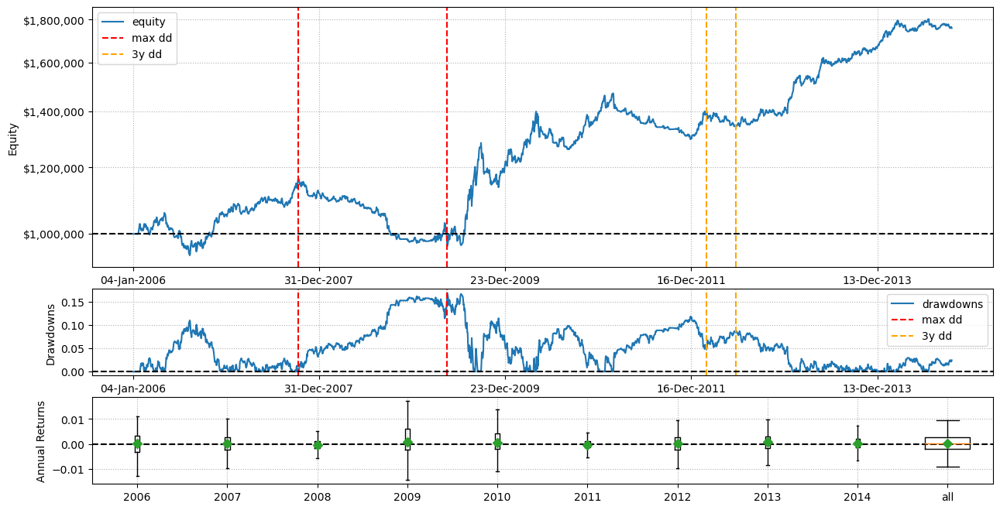

In [18]:
strat_test.evaluate_returns()

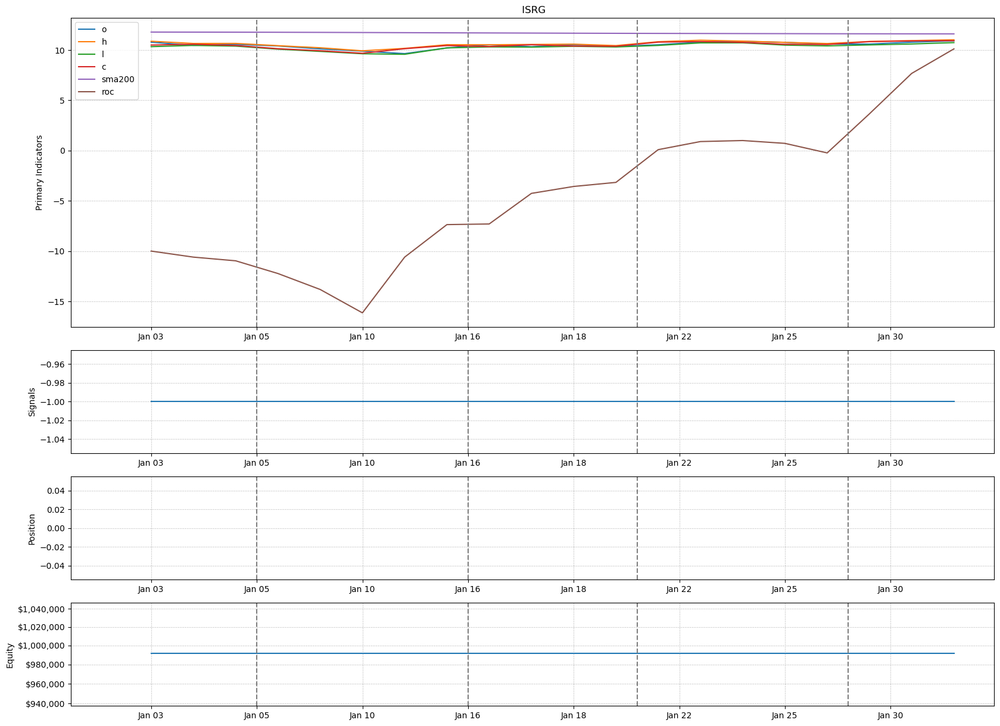

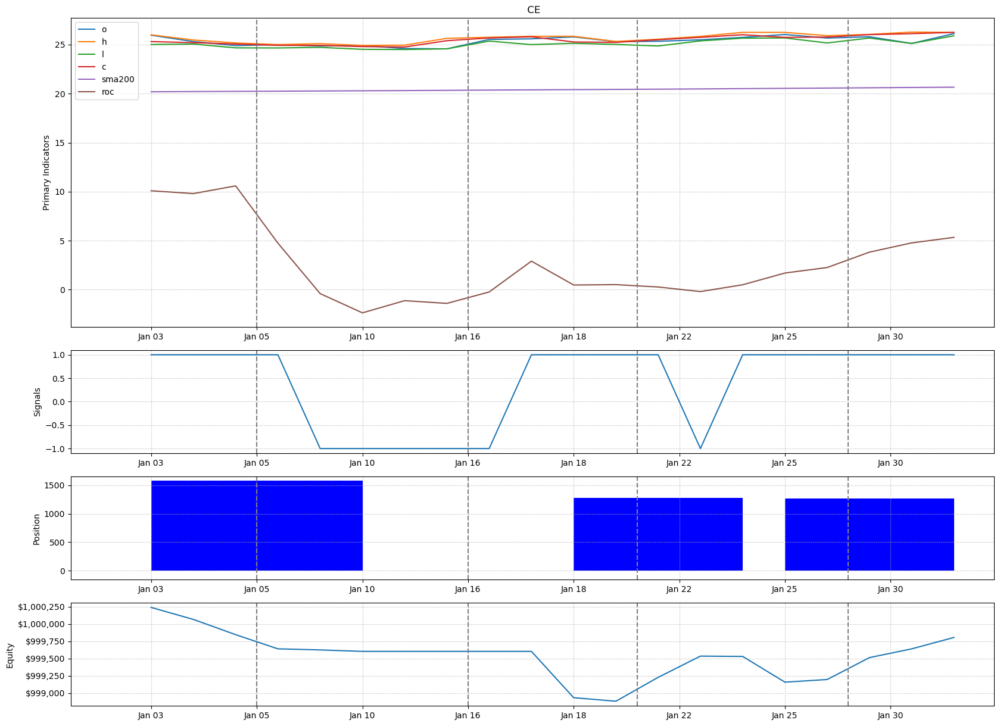

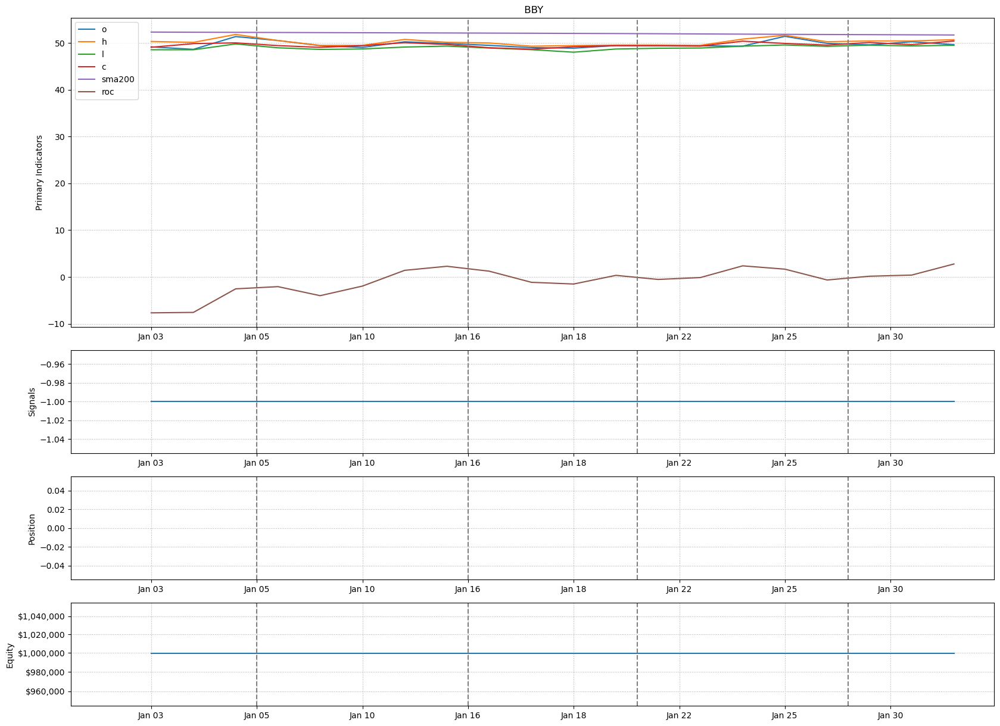

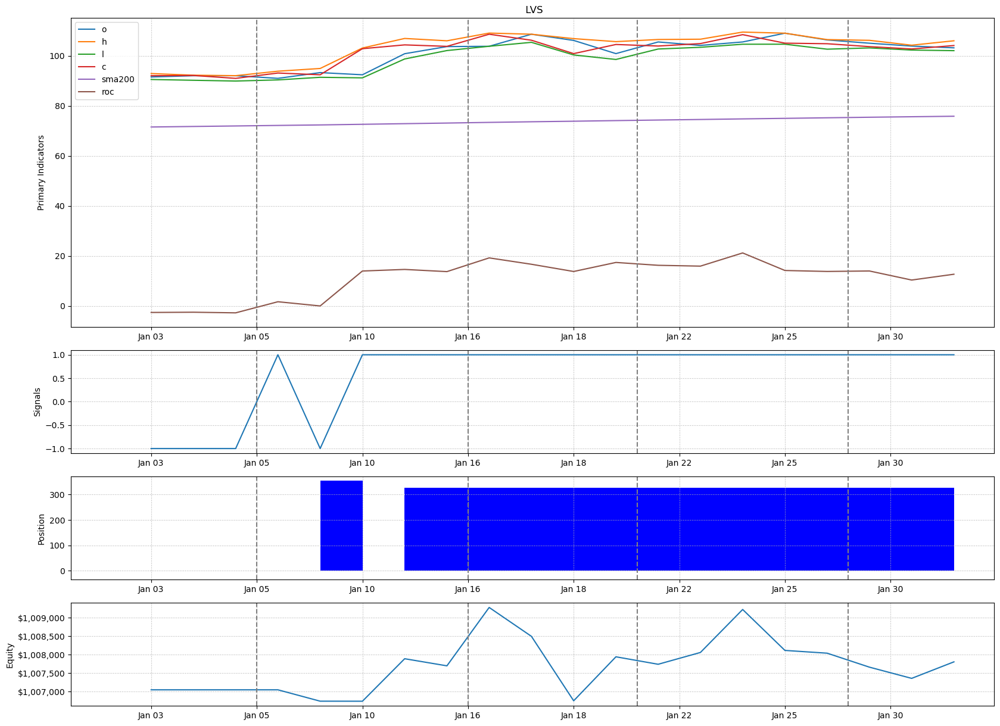

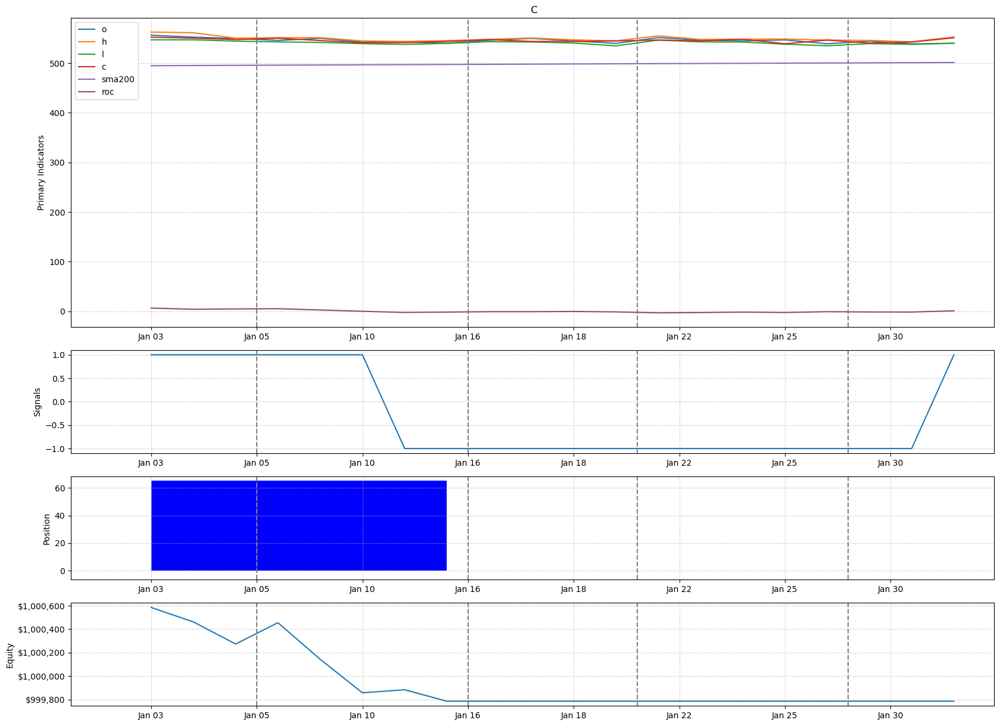

...

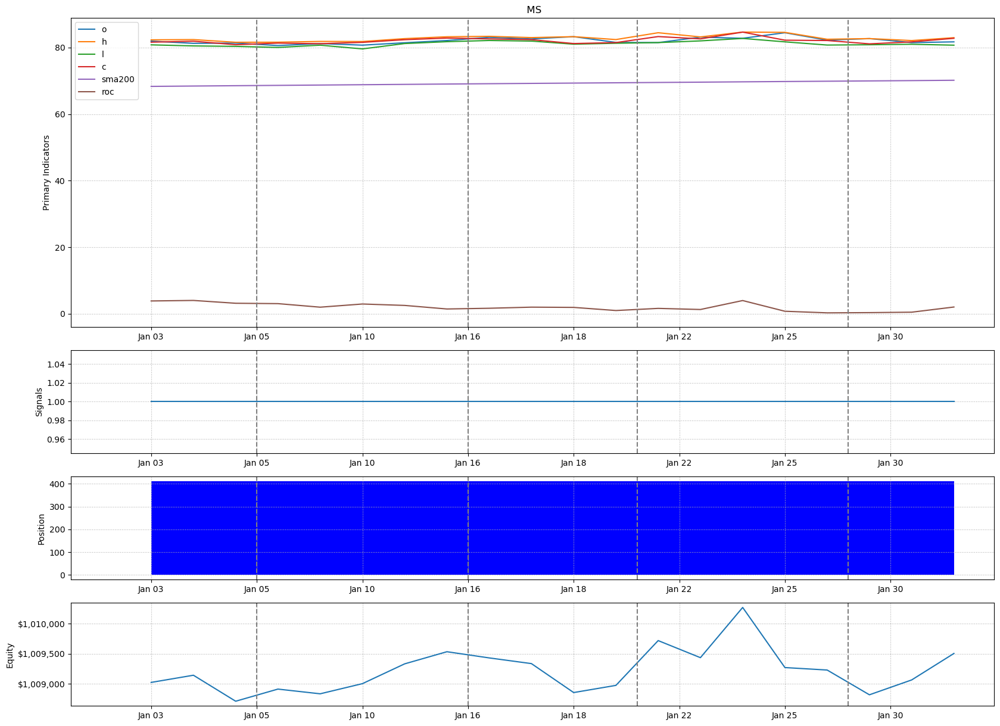

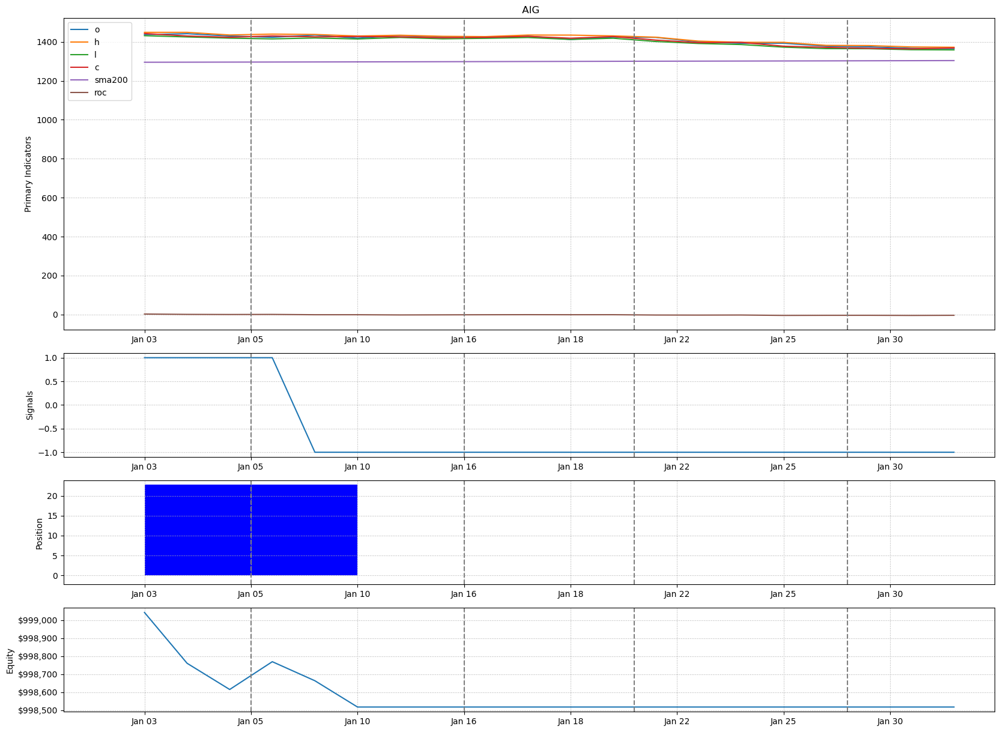

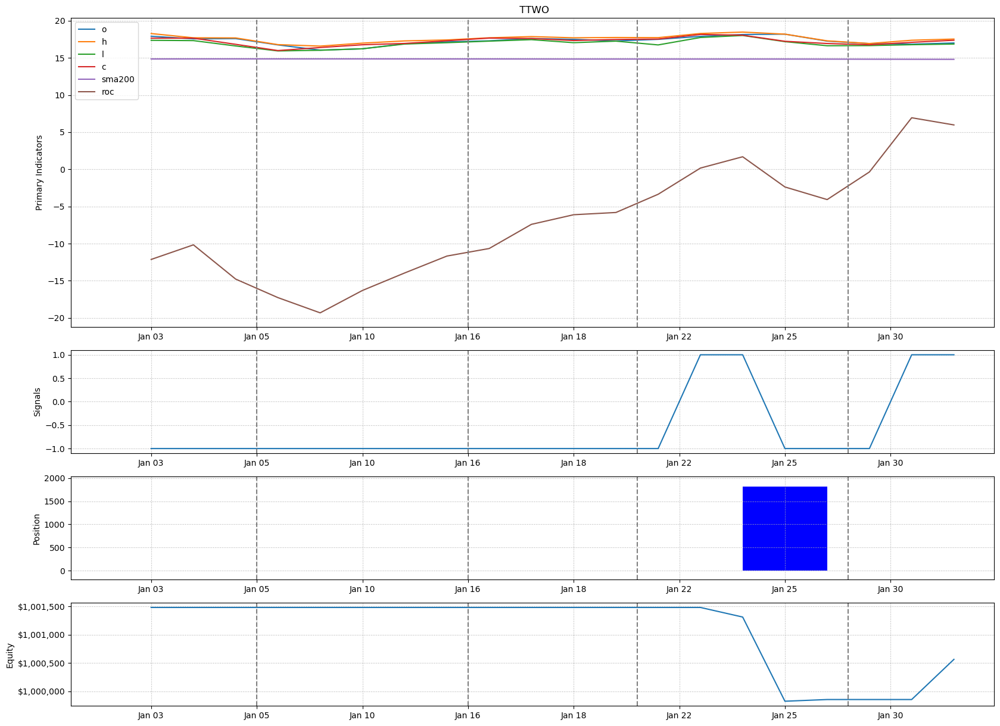

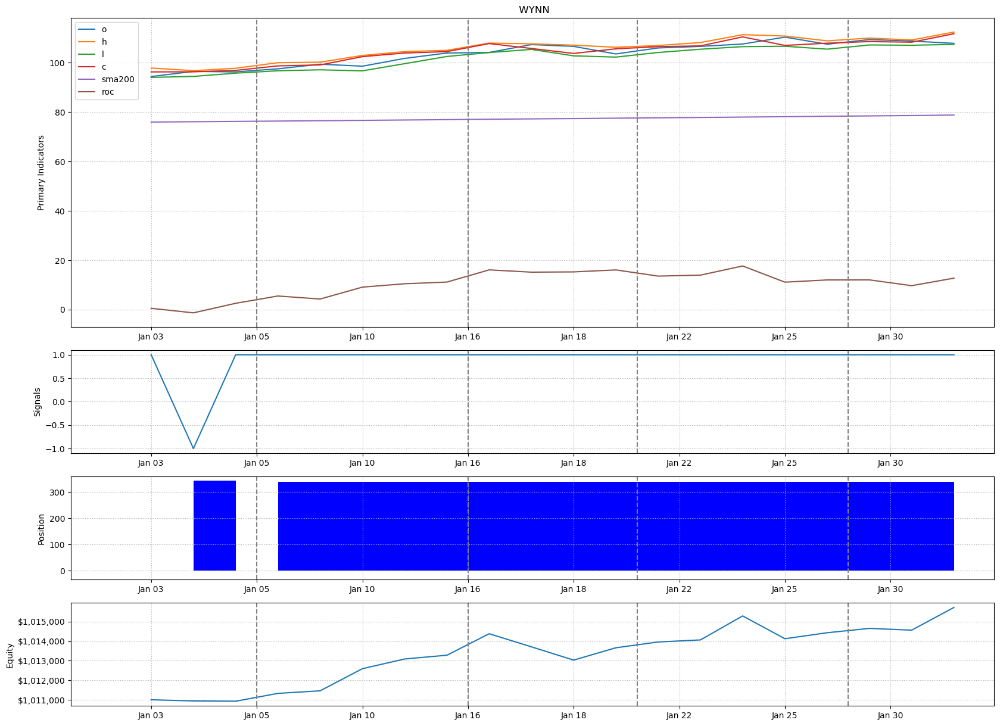

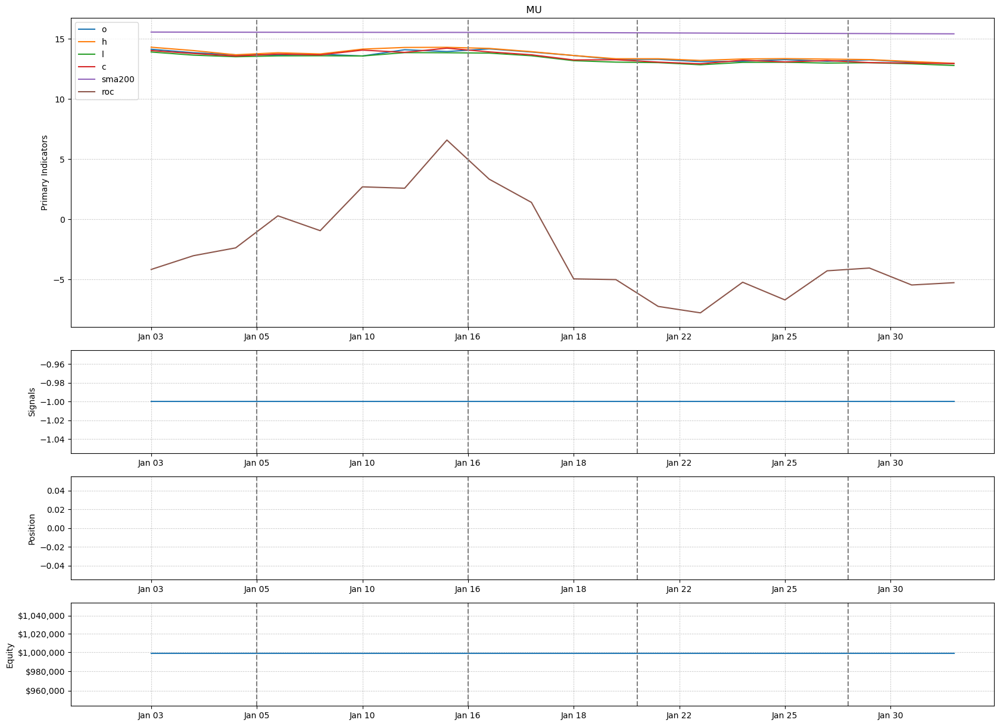

In [19]:
strat_test.plot(date_range=(np.datetime64('2007-01-03'), np.datetime64('2007-01-31')))
#strat_test.plot()

We can see that the model is entering and exiting trades appropriately


## Look at what happened under the hood (PnLs, positions, quantities...) 

In [20]:
strat_test.df_returns()

,timestamp,net_pnl,equity,ret
0,2006-01-03,0,1000000,NaN
1,2006-01-04,0,1000000,0
2,2006-01-05,0,1000000,0
3,2006-01-06,0,1000000,0
6,2006-01-09,0,1000000,0
...,...,...,...,...
3187,2014-09-25,758112.689,1758112.69,-0.0028958468
3188,2014-09-26,762164.65,1762164.65,0.00230472199
3191,2014-09-29,764699.107,1764699.11,0.00143826328
3192,2014-09-30,764062.687,1764062.69,-0.000360639106


In [21]:
strat_test.df_data().iloc[:20]

,timestamp,c,h,l,o,roc,sma200,strategy_signal,position,unrealized,realized,commission,fee,net_pnl,equity,i
0,2006-01-03,12.8666668,13.21,12.5433331,13.21,NaN,NaN,0,0,0,0,0,0,0,1000000,0
1,2006-01-04,13.5622215,13.5644436,12.8888893,12.914444,NaN,NaN,0,0,0,0,0,0,0,1000000,1
2,2006-01-05,13.3644438,13.7777777,13.3055563,13.7755556,NaN,NaN,0,0,0,0,0,0,0,1000000,2
3,2006-01-06,13.3411112,13.5755558,13.0288887,13.081111,NaN,NaN,0,0,0,0,0,0,0,1000000,3
4,2006-01-09,13.7444439,13.8888893,13.3644438,13.3644438,NaN,NaN,0,0,0,0,0,0,0,1000000,4
5,2006-01-10,14.248889,14.3277779,13.6422224,13.666667,NaN,NaN,0,0,0,0,0,0,0,1000000,5
6,2006-01-11,14.1466665,14.4688892,13.914444,14.3255558,NaN,NaN,0,0,0,0,0,0,0,1000000,6
7,2006-01-12,14.5177784,14.7977781,14.4200001,14.6800003,NaN,NaN,0,0,0,0,0,0,0,1000000,7
8,2006-01-13,14.2166672,14.6111107,14.081111,14.6099997,NaN,NaN,0,0,0,0,0,0,0,1000000,8
9,2006-01-17,14.5655556,14.6011114,14.0088892,14.1777782,NaN,NaN,0,0,0,0,0,0,0,1000000,9


In [22]:
strat_test.df_pnl().iloc[:20]

,timestamp,position,unrealized,realized,commission,fee,net_pnl,equity
0,2006-01-03,0,0,0,0,0,0,1000000
1,2006-01-04,0,0,0,0,0,0,1000000
2,2006-01-05,0,0,0,0,0,0,1000000
3,2006-01-06,0,0,0,0,0,0,1000000
4,2006-01-09,0,0,0,0,0,0,1000000
5,2006-01-10,0,0,0,0,0,0,1000000
6,2006-01-11,0,0,0,0,0,0,1000000
7,2006-01-12,0,0,0,0,0,0,1000000
8,2006-01-13,0,0,0,0,0,0,1000000
9,2006-01-17,0,0,0,0,0,0,1000000


In [23]:
strat_test.df_orders().iloc[:20]

,symbol,type,timestamp,qty,reason_code,order_props,contract_props
0,ISRG,MarketOrder,2006-01-25,2217.02954,enter long,,
1,CE,MarketOrder,2006-01-25,1621.06379,enter long,,
2,BBY,MarketOrder,2006-01-25,665.89987,enter long,,
3,LVS,MarketOrder,2006-01-25,690.13109,enter long,,
4,F,MarketOrder,2006-01-25,3834.08582,enter long,,
5,DXCM,MarketOrder,2006-01-25,8371.35871,enter long,,
6,DHI,MarketOrder,2006-01-25,879.835733,enter long,,
7,AMD,MarketOrder,2006-01-25,849.924001,enter long,,
8,URI,MarketOrder,2006-01-25,1266.45426,enter long,,
9,VLO,MarketOrder,2006-01-25,613.899626,enter long,,


In [24]:
strat_test.df_trades().iloc[:30]

,symbol,timestamp,qty,price,fee,commission,order_date,order_qty,reason_code,order_props,contract_props
7,AMD,2006-01-26,849.924001,38.8199997,0,2.974734,2006-01-25,849.924001,enter long,,
2,BBY,2006-01-26,665.89987,49.5499992,0,2.33064954,2006-01-25,665.89987,enter long,,
1,CE,2006-01-26,1621.06379,20.3500004,0,5.67372325,2006-01-25,1621.06379,enter long,,
6,DHI,2006-01-26,879.835733,37.5,0,3.07942507,2006-01-25,879.835733,enter long,,
5,DXCM,2006-01-26,8371.35871,3.93499994,0,29.2997555,2006-01-25,8371.35871,enter long,,
4,F,2006-01-26,3834.08582,8.60000038,0,13.4193004,2006-01-25,3834.08582,enter long,,
13,FFIV,2006-01-26,1054.07734,31.2999992,0,3.68927068,2006-01-25,1054.07734,enter long,,
12,ILMN,2006-01-26,3312.58622,9.95499992,0,11.5940518,2006-01-25,3312.58622,enter long,,
0,ISRG,2006-01-26,2217.02954,14.8777781,0,7.7596034,2006-01-25,2217.02954,enter long,,
3,LVS,2006-01-26,690.13109,47.8100014,0,2.41545882,2006-01-25,690.13109,enter long,,


In [25]:
strat_test.df_returns().iloc[:30]

,timestamp,net_pnl,equity,ret
0,2006-01-03,0,1000000,NaN
1,2006-01-04,0,1000000,0
2,2006-01-05,0,1000000,0
3,2006-01-06,0,1000000,0
6,2006-01-09,0,1000000,0
7,2006-01-10,0,1000000,0
8,2006-01-11,0,1000000,0
9,2006-01-12,0,1000000,0
10,2006-01-13,0,1000000,0
14,2006-01-17,0,1000000,0


<Figure size 1600x800 with 0 Axes>

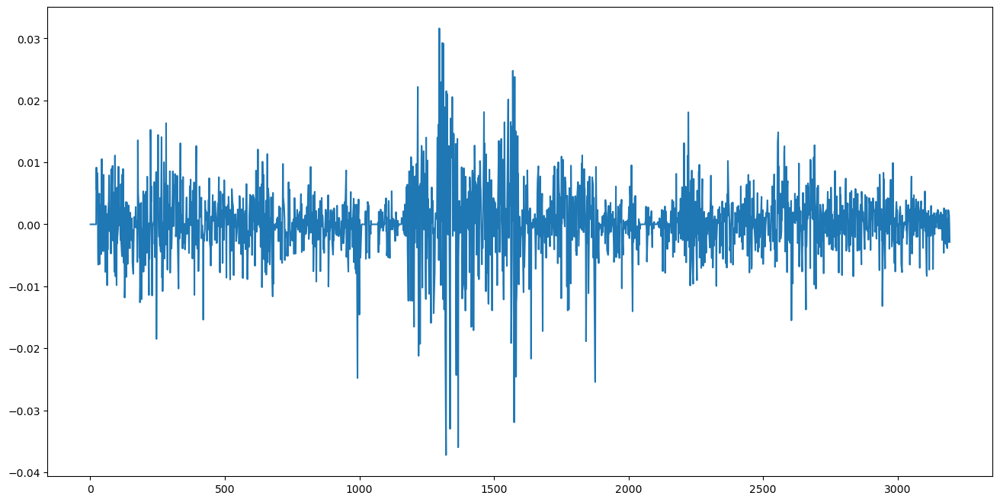

In [26]:
plt.figure(figsize=(16,8))

returns_df = pd.DataFrame(strat_test.df_returns())
plt.plot(returns_df['ret'].iloc[:])

# ROBUSTNESS TESTING

## Optimisation

### Separate the train set into 5 subsets 

In [16]:
def create_folds(data, num_folds):
    fold_size = len(data) // num_folds
    folds = []

    for i in range(num_folds):
        start_idx = i * fold_size
        end_idx = start_idx + fold_size

        if i == num_folds - 1:
            end_idx = len(data)

        fold_data = data.iloc[start_idx:end_idx]
        folds.append(fold_data)

    return folds

folds = create_folds(is_df, 5)
folds[0]

,ISRG_o,ISRG_h,ISRG_l,ISRG_c,CE_o,CE_h,CE_l,CE_c,BBY_o,BBY_h,BBY_l,BBY_c,LVS_o,LVS_h,LVS_l,LVS_c,C_o,C_h,C_l,C_c,MGM_o,MGM_h,MGM_l,MGM_c,F_o,F_h,F_l,F_c,DXCM_o,DXCM_h,DXCM_l,DXCM_c,MOS_o,MOS_h,MOS_l,MOS_c,DHI_o,DHI_h,DHI_l,DHI_c,AMD_o,AMD_h,AMD_l,AMD_c,URI_o,URI_h,URI_l,URI_c,VLO_o,...,FITB_c,ILMN_o,ILMN_h,ILMN_l,ILMN_c,AAL_o,AAL_h,AAL_l,AAL_c,FFIV_o,FFIV_h,FFIV_l,FFIV_c,RCL_o,RCL_h,RCL_l,RCL_c,LYV_o,LYV_h,LYV_l,LYV_c,ON_o,ON_h,ON_l,ON_c,PHM_o,PHM_h,PHM_l,PHM_c,MS_o,MS_h,MS_l,MS_c,AIG_o,AIG_h,AIG_l,AIG_c,TTWO_o,TTWO_h,TTWO_l,TTWO_c,WYNN_o,WYNN_h,WYNN_l,WYNN_c,MU_o,MU_h,MU_l,MU_c
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2006-01-03,13.21,13.21,12.5433331,12.8666668,19.3500004,19.8400002,18.8999996,19.7700005,43.75,44.9900017,43.4500008,44.7299995,39.7200012,39.7400017,38.4399986,38.6800003,490,493.799988,481.100006,492.899994,36.9500008,37.2000008,35.6199989,36.9300003,7.71999979,7.82999992,7.65999985,7.82999992,3.74749994,3.74749994,3.625,3.625,14.6400003,15,14.6400003,15,36.4599991,37.1199989,35.2000008,36.9399986,31.0200005,32.5800018,30.8799992,32.4000015,23.5900002,23.8700008,23.0699997,23.8199997,48.0347366,...,37.8699989,7.125,7.40500021,6.875,7.40500021,37.2000008,38.2799988,36.8499985,37.4500008,28.8549995,31.2000008,28.3500004,30.8950005,45.4799995,45.4799995,44.3300018,44.9599991,12.8999996,13.5,12.8100004,13.5,5.53999996,5.76999998,5.53999996,5.76999998,39.5,41.4599991,39.5,41.2400017,57.1699982,58.4900017,56.7400017,58.3100014,1378.80005,1393.19995,1336.80005,1392.40002,17.7000008,18.1900005,17.7000008,18.0499992,54.8499985,54.9900017,52.6399994,53.9500008,13.4799995,13.6000004,13.3400002,13.5100002
2006-01-04,12.914444,13.5644436,12.8888893,13.5622215,19.7700005,19.9500008,19.4500008,19.7999992,44.5999985,44.6100006,43.6300011,44.0499992,38.7999992,40.5900002,38.75,40.0900002,488.600006,491,483.5,483.799988,36.9300003,36.9300003,35.8800011,35.9799995,7.82999992,8.07999992,7.82000017,8.01000023,3.66000009,3.95000005,3.6500001,3.8125,15.0100002,15.25,15.0100002,15.1999998,36.8300018,36.8400002,36.3400002,36.6399994,32.5,33.0999985,32.4500008,32.5600014,23.8199997,23.9400005,23.5200005,23.7399998,48.9945145,...,38.3400002,7.40500021,7.79500008,7.28000021,7.6500001,37.7000008,40.5999985,37.7000008,39.2000008,31.0249996,32,30.6450005,31.8649998,45.1899986,45.2999992,44.3800011,44.7999992,13.4700003,13.8500004,13,13,5.78000021,5.86999989,5.76000023,5.76999998,41.2400017,41.4300003,40.5299988,40.8899994,58.7000008,59.2799988,58.3499985,58.3499985,1395.80005,1407,1385.19995,1394.40002,18.1499996,18.1800003,17.6000004,17.8099995,53.7599983,54.1699982,52.4399986,53.8499985,13.75,14.1400003,13.6400003,14.0500002
2006-01-05,13.7755556,13.7777777,13.3055563,13.3644438,19.7999992,19.9599991,19.4500008,19.7700005,44.0999985,44.5,43.3199997,43.5,40.0999985,40.7700005,40.0999985,40.5299988,484.399994,487.799988,484,486.200012,36.3499985,36.4000015,35.5999985,35.75,8.05000019,8.39999962,8.02999973,8.35000038,3.85750008,3.96000004,3.7874999,3.95000005,15.1599998,15.5900002,15.1099997,15.4899998,36.4000015,37.9799995,36.4000015,37.3699989,32.5099983,33.9399986,32.5099983,33.6800003,23.6700001,23.8999996,23.5699997,23.8400002,50.0914078,...,38.8600006,7.63999987,7.80000019,7.63000011,7.73999977,39.1800003,39.7099991,38.9099998,39.7099991,32.0499992,32.25,31.8400002,32.1150017,44.8199997,44.8699989,44.5099983,44.7200012,13.3000002,13.3100004,12.9499998,13,5.76000023,6.01999998,5.75,5.9000001,40.6699982,42.2900009,40.6699982,41.8199997,58.5499992,58.5900002,58.0200005,58.5099983,1398,1401,1388.59998,1396.19995,17.9699993,18.5599995,17.8700008,18.4699993,53.9500008,54.1699982,53,53.5299988,14.0200005,14.1999998,13.8999996,14.1800003
2006-01-06,13.081111,13.5755558,13.0288887,13.3411112,19.8299999,19.8899994,19.6299992,19.7299995,46.9700012,47.3300018,46.1500015,47.0499992,40.8499985,41.9199982,40.8499985,41.6100006,488.799988,489,482,486.200012,36.2000008,37,36.0400009,36

In [17]:
timestamps_fold1 = folds[0].index.values
timestamps_fold2 = folds[1].index.values
timestamps_fold3 = folds[2].index.values
timestamps_fold4 = folds[3].index.values
timestamps_fold5 = folds[4].index.values

print(len(timestamps_fold1))
print(len(timestamps_fold2))
print(len(timestamps_fold3))
print(len(timestamps_fold4))
print(len(timestamps_fold5))

440
440
440
440
442


### Optimisation on each subset

We are going to optimise our parameters on 5 different subsets and then extract the combinations who averaged the best performances across the 5 subsets.

By doing this, we do not extract the combination who have the best performance in sample but the combination who performs the best, on average, across each subsets of the in sample data.

In other words, it extracts the combinations who is the more robust, adaptable and capable of performing well in various market conditions.

Indeed, by optimising on one training set only, we could have extracted a better performing combination, but this combination could have performed better than others only because it had a very good run on one specific set of the training set whereas it could have had not good runs at all on other sets of the training data.

We prefer less performance but more robustness

In [18]:
from pyqstrat.evaluator import compute_sharpe, compute_sortino, compute_maxdd_pct, compute_amean, compute_rolling_dd
from pyqstrat.evaluator import compute_periods_per_year

pq.ContractGroup.clear()

In [19]:
from functools import partial
def cost_func(suggestion, prices_df):
    strategy_context = SimpleNamespace(prices_df=prices_df,
                                       timestamp=timestamps_fold1,
                                       symbols=selected_tickers,
                                       lb=suggestion['lb'],
                                       threshold=suggestion['threshold'])
    
    strategy = build_example_strategy(strategy_context)
    strategy.run()
    
    returns_df = strategy.df_returns().set_index('timestamp')
    
    num_trades = len(strategy.df_trades())
    
    returns = returns_df.ret.values
    equity = returns_df.equity.values
    dates = returns_df.index.values
    
    periods_per_year = compute_periods_per_year(dates)
    
    amean = compute_amean(returns, periods_per_year)
    sharpe = compute_sharpe(returns, amean, periods_per_year)
    sortino = compute_sortino(returns, amean, periods_per_year)
    rolling_dd = compute_rolling_dd(dates, equity)
    maxdd = compute_maxdd_pct(rolling_dd[1])
    
    return sharpe, {'sortino': sortino, 'maxdd': maxdd, 'num_trades': num_trades, 'amean': amean}

In [20]:
def generator(prices_df):
    for lb in range(5,101,1):
        for threshold in range(0, 20, 1):
            yield {'lb': lb, 'threshold': threshold}

#### Optimisation on fold 1 

<Figure size 800x600 with 0 Axes>

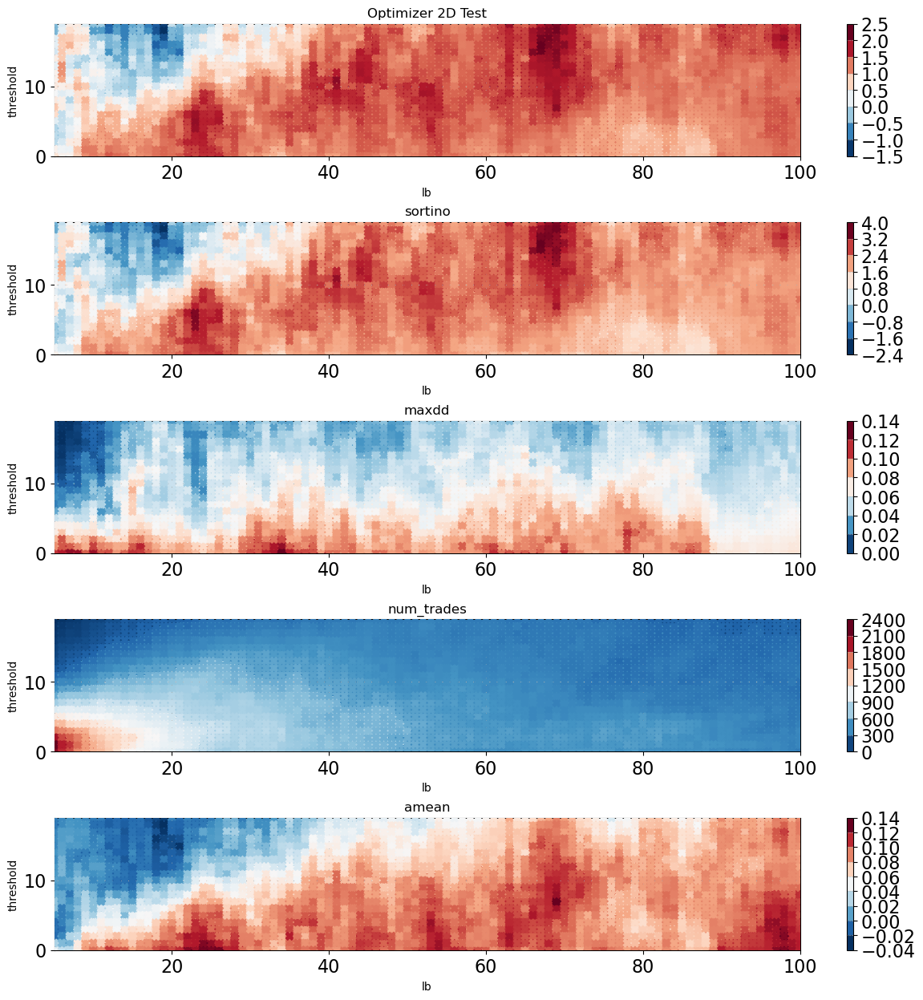

In [21]:
additional_arg_value = folds[0]
cost_func_with_prices_df = partial(cost_func, prices_df=additional_arg_value)

optimizer_fold1 = pq.Optimizer('example', \
                               generator(prices_df=additional_arg_value), \
                               cost_func_with_prices_df, max_processes=12)

optimizer_fold1.run(raise_on_error=True)
optimizer_fold1.plot_3d(x = 'lb', y = 'threshold', hspace = 0.5, plot_type='contour');

#### Optimisation on fold 2

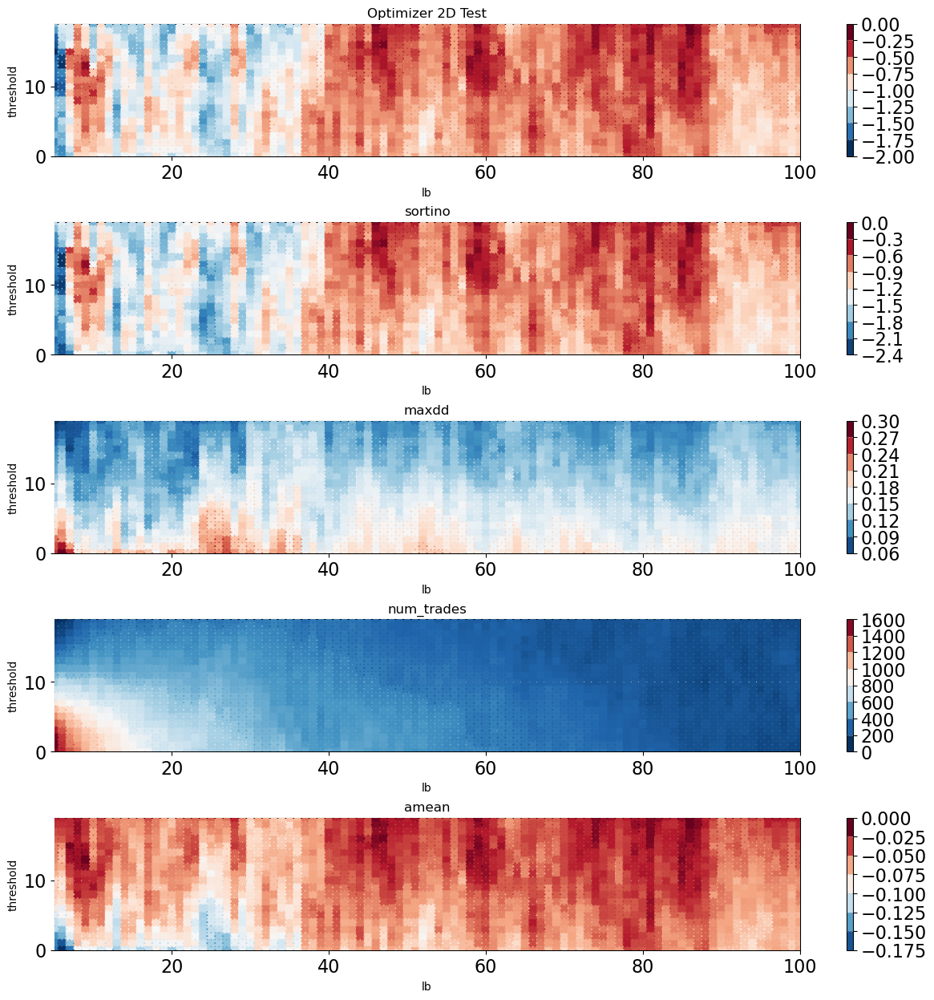

In [34]:
additional_arg_value = folds[1]
cost_func_with_prices_df = partial(cost_func, prices_df=additional_arg_value)

optimizer_fold2 = pq.Optimizer('example', \
                               generator(prices_df=additional_arg_value), \
                               cost_func_with_prices_df, max_processes=8)
optimizer_fold2.run(raise_on_error=True)
optimizer_fold2.plot_3d(x = 'lb', y = 'threshold', hspace = 0.5, plot_type='contour');

#### Optimise on fold 3

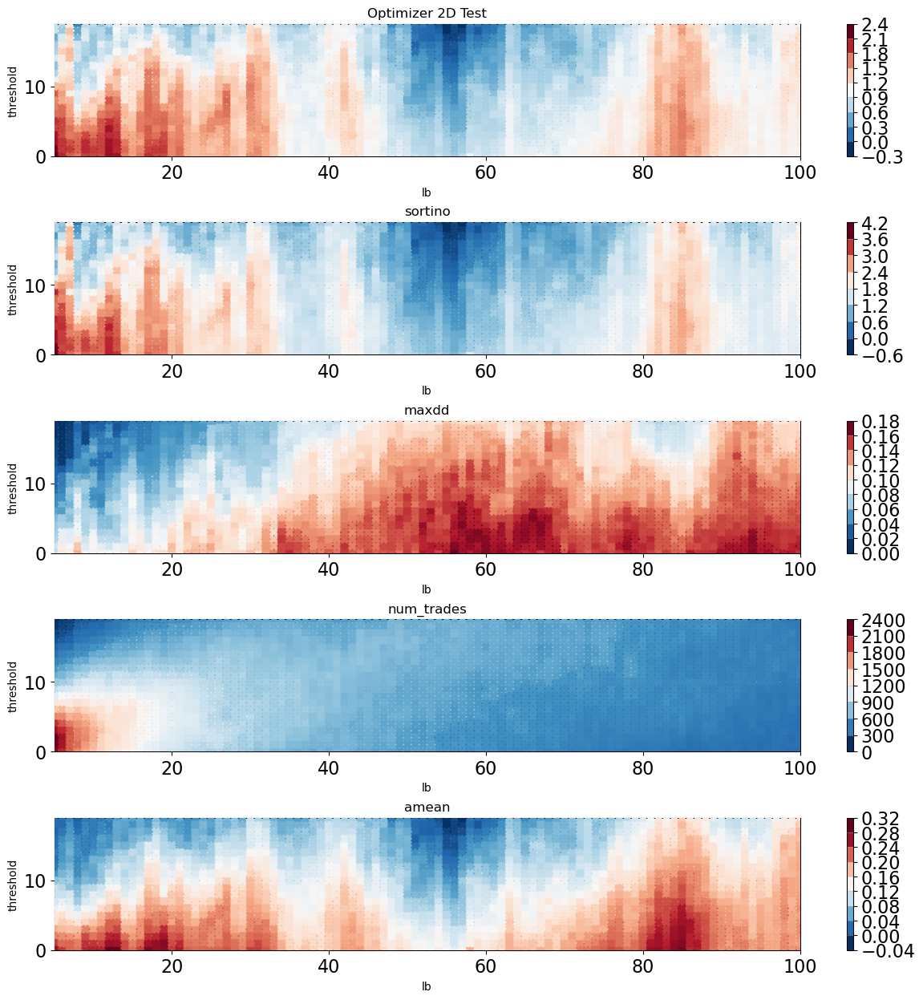

In [37]:
additional_arg_value = folds[2]
cost_func_with_prices_df = partial(cost_func, prices_df=additional_arg_value)

optimizer_fold3 = pq.Optimizer('example', \
                               generator(prices_df=additional_arg_value), \
                               cost_func_with_prices_df, \
                               max_processes=10)
optimizer_fold3.run(raise_on_error=True)
optimizer_fold3.plot_3d(x = 'lb', y = 'threshold', hspace = 0.5, plot_type='contour');

#### Optimise on fold 4

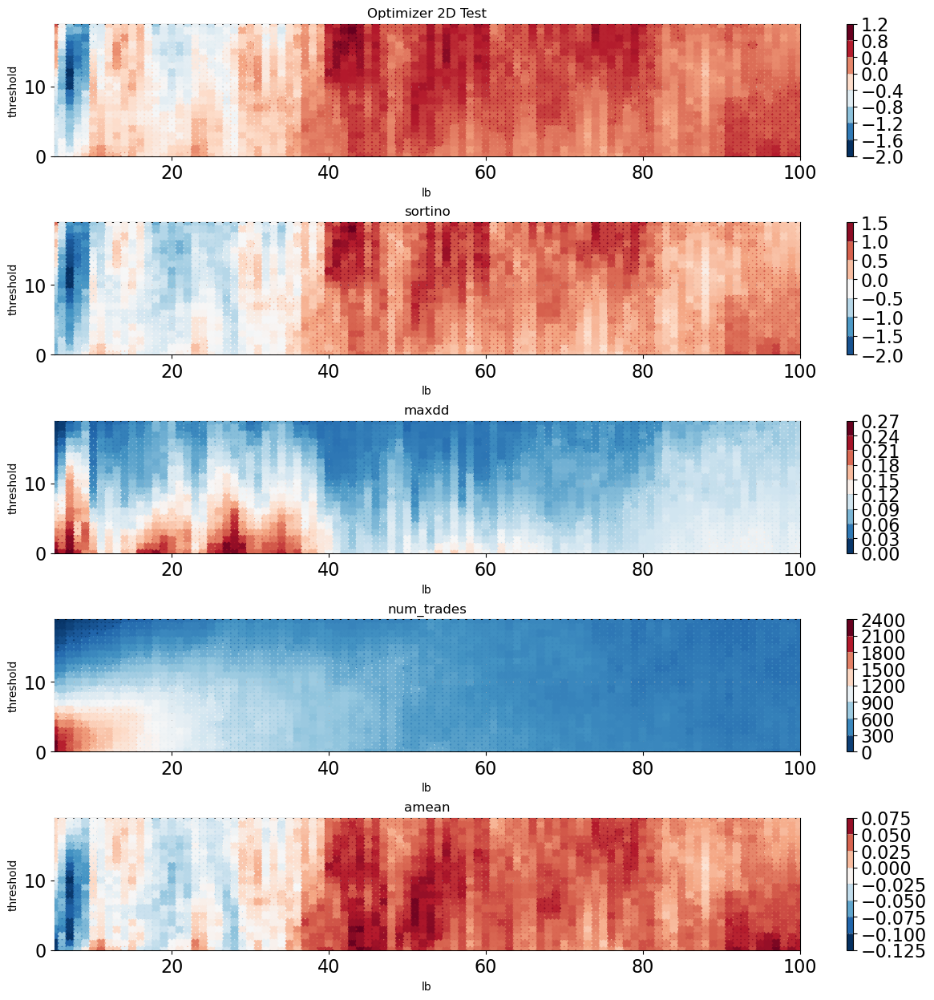

In [40]:
additional_arg_value = folds[3]
cost_func_with_prices_df = partial(cost_func, prices_df=additional_arg_value)

optimizer_fold4 = pq.Optimizer('example', \
                               generator(prices_df=additional_arg_value), \
                               cost_func_with_prices_df, \
                               max_processes=8)
optimizer_fold4.run(raise_on_error=True)
optimizer_fold4.plot_3d(x = 'lb', y = 'threshold', hspace = 0.5, plot_type='contour');

#### Optimise on fold 5

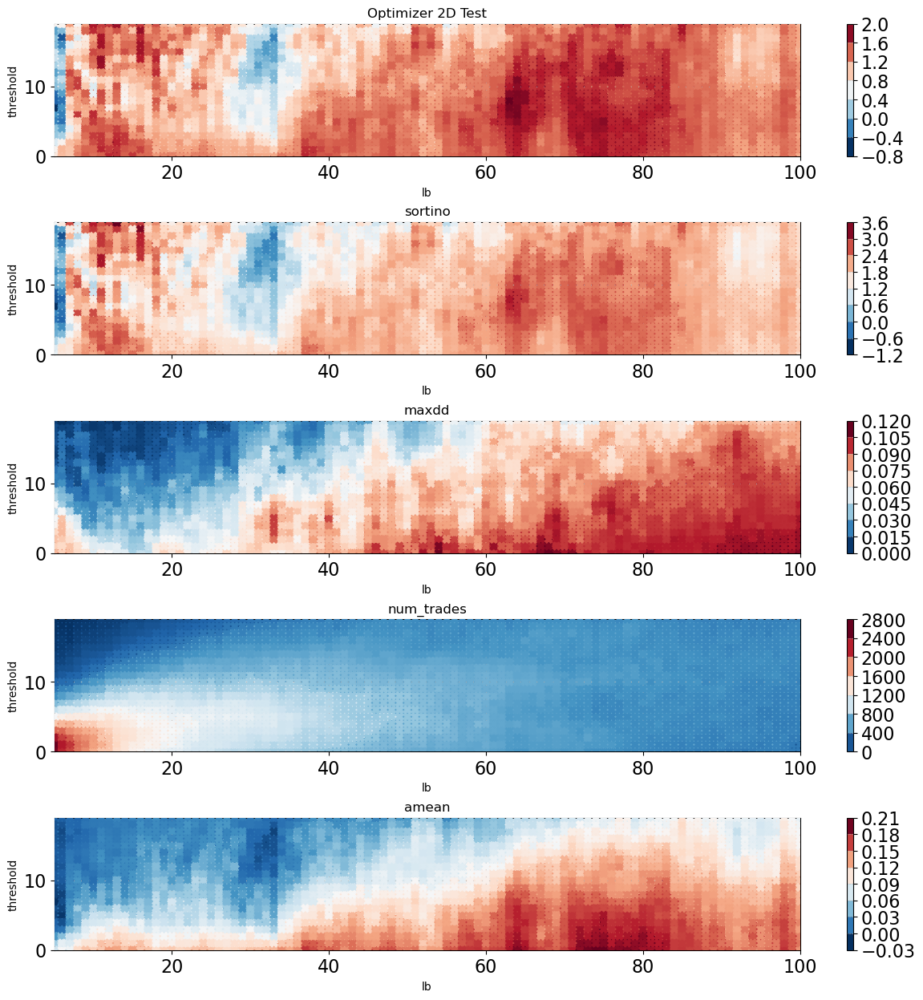

In [43]:
additional_arg_value = folds[4]
cost_func_with_prices_df = partial(cost_func, prices_df=additional_arg_value)

optimizer_fold5 = pq.Optimizer('example', \
                               generator(prices_df=additional_arg_value), \
                               cost_func_with_prices_df, \
                               max_processes=8)
optimizer_fold5.run(raise_on_error=True)
optimizer_fold5.plot_3d(x = 'lb', y = 'threshold', hspace = 0.5, plot_type='contour');

## Sensitivity analysis 

### Verify that the 20 best combinations are grouped in clusters

In [44]:
#results_f1 = optimizer_fold1.df_experiments(ascending=False)
results_f1 = optimizer_fold1.df_experiments()
results_f1 = results_f1.sort_values(by=['lb', 'threshold'])
results_f1 = results_f1.reset_index()
results_f1

,index,lb,threshold,cost,maxdd,sortino,amean,num_trades
0,7,5,0,0.597529922,0.109722884,0.965257131,0.0451545569,2089
1,8,5,1,0.406796732,0.093971132,0.648989172,0.026738897,2158
2,6,5,2,-0.154570272,0.0866520519,-0.241789699,-0.00875857118,1992
3,4,5,3,-0.132218222,0.0712168246,-0.206667386,-0.00643328859,1670
4,11,5,4,-0.197421887,0.0697872084,-0.303156981,-0.0081346406,1448
...,...,...,...,...,...,...,...,...
1915,1912,100,15,1.43211299,0.0481314698,2.28569946,0.0876364072,336
1916,1919,100,16,1.51951846,0.0449465514,2.45614318,0.0894590453,318
1917,1916,100,17,1.62233362,0.0455808147,2.63501404,0.092712676,294
1918,1918,100,18,1.67364247,0.0449302214,2.75363502,0.0930248498,288


In [45]:
results_f2 = optimizer_fold2.df_experiments()
results_f2 = results_f2.sort_values(by=['lb', 'threshold'])
results_f2 = results_f2.reset_index()
results_f2

,index,lb,threshold,cost,maxdd,sortino,amean,num_trades
0,5,5,0,-1.38203793,0.278242983,-2.01362898,-0.172787354,1529
1,7,5,1,-1.46997557,0.266364436,-2.10272531,-0.166985406,1575
2,6,5,2,-1.53743683,0.255443899,-2.20105136,-0.159235965,1537
3,4,5,3,-1.3498131,0.217527253,-1.92988337,-0.129539134,1441
4,3,5,4,-1.4835412,0.208177783,-2.06876572,-0.12710546,1306
...,...,...,...,...,...,...,...,...
1915,1915,100,15,-0.544410505,0.131391626,-0.776462489,-0.0422784045,244
1916,1916,100,16,-0.455426151,0.120439952,-0.648062363,-0.0349597273,248
1917,1917,100,17,-0.492044247,0.119729018,-0.695767865,-0.0374856413,256
1918,1918,100,18,-0.447022278,0.112470111,-0.631865941,-0.0336569001,246


In [46]:
results_f3 = optimizer_fold3.df_experiments()
results_f3 = results_f3.sort_values(by=['lb', 'threshold'])
results_f3 = results_f3.reset_index()
results_f3

,index,lb,threshold,cost,maxdd,sortino,amean,num_trades
0,9,5,0,2.22208869,0.0799357655,3.89686934,0.2602939,2155
1,8,5,1,2.16102968,0.0819925822,3.81554912,0.235382495,2243
2,7,5,2,2.04224043,0.0745509491,3.57352142,0.206741163,2224
3,6,5,3,2.01664077,0.0712742294,3.57456862,0.187790078,2082
4,5,5,4,1.83632399,0.0676752172,3.30707211,0.155471765,1956
...,...,...,...,...,...,...,...,...
1915,1915,100,15,1.23589722,0.122864652,1.90622956,0.186759,476
1916,1914,100,16,1.2027737,0.121941765,1.84928581,0.178816407,466
1917,1919,100,17,1.25410132,0.118175768,1.93747123,0.181960316,458
1918,1918,100,18,1.21033291,0.11531684,1.85613,0.170466635,460


In [47]:
results_f4 = optimizer_fold4.df_experiments()
results_f4 = results_f4.sort_values(by=['lb', 'threshold'])
results_f4 = results_f4.reset_index()
results_f4

,index,lb,threshold,cost,maxdd,sortino,amean,num_trades
0,7,5,0,-0.677602572,0.245622228,-0.939899585,-0.104663695,2141
1,6,5,1,-0.76558608,0.226535596,-1.05077423,-0.105642947,2179
2,4,5,2,-0.69602173,0.200277198,-0.943235481,-0.0862044334,2062
3,5,5,3,-0.658623069,0.185590974,-0.875335985,-0.0748519779,1966
4,3,5,4,-0.574402793,0.166549294,-0.749812302,-0.0601455256,1774
...,...,...,...,...,...,...,...,...
1915,1914,100,15,0.259586948,0.0995193913,0.390716005,0.0210834032,369
1916,1916,100,16,0.247437631,0.0961445321,0.3705945,0.0195908359,369
1917,1917,100,17,0.210452785,0.0952351677,0.314545197,0.0163293007,371
1918,1918,100,18,0.182770308,0.092286253,0.272612418,0.0137926918,369


In [48]:
results_f5 = optimizer_fold5.df_experiments()
results_f5 = results_f5.sort_values(by=['lb', 'threshold'])
results_f5 = results_f5.reset_index()
results_f5

,index,lb,threshold,cost,maxdd,sortino,amean,num_trades
0,7,5,0,0.806170165,0.0771912254,1.20269932,0.070918772,2446
1,4,5,1,0.724964291,0.0722931272,1.08164751,0.0553319685,2486
2,6,5,2,0.480641365,0.0755746617,0.707088952,0.0307934093,2313
3,5,5,3,0.170879505,0.0711387908,0.252921145,0.0089632406,1963
4,3,5,4,0.133633971,0.0616862925,0.195176467,0.00539731918,1601
...,...,...,...,...,...,...,...,...
1915,1915,100,15,1.12927696,0.0800751459,1.73879225,0.0940341616,493
1916,1916,100,16,1.15994934,0.0808274772,1.7928296,0.0939529711,487
1917,1917,100,17,1.17172582,0.0801437572,1.78992218,0.0915410582,474
1918,1919,100,18,1.17497335,0.0806563143,1.77494117,0.0886790107,464


In [49]:
results = results_f1
results = results.drop(columns=['num_trades','sortino','maxdd','cost'])
results

,index,lb,threshold,amean
0,7,5,0,0.0451545569
1,8,5,1,0.026738897
2,6,5,2,-0.00875857118
3,4,5,3,-0.00643328859
4,11,5,4,-0.0081346406
...,...,...,...,...
1915,1912,100,15,0.0876364072
1916,1919,100,16,0.0894590453
1917,1916,100,17,0.092712676
1918,1918,100,18,0.0930248498


In [50]:
results['amean2'] = results_f2['amean']
results['amean3'] = results_f3['amean']
results['amean4'] = results_f4['amean']
results['amean5'] = results_f5['amean']
results

,index,lb,threshold,amean,amean2,amean3,amean4,amean5
0,7,5,0,0.0451545569,-0.172787354,0.2602939,-0.104663695,0.070918772
1,8,5,1,0.026738897,-0.166985406,0.235382495,-0.105642947,0.0553319685
2,6,5,2,-0.00875857118,-0.159235965,0.206741163,-0.0862044334,0.0307934093
3,4,5,3,-0.00643328859,-0.129539134,0.187790078,-0.0748519779,0.0089632406
4,11,5,4,-0.0081346406,-0.12710546,0.155471765,-0.0601455256,0.00539731918
...,...,...,...,...,...,...,...,...
1915,1912,100,15,0.0876364072,-0.0422784045,0.186759,0.0210834032,0.0940341616
1916,1919,100,16,0.0894590453,-0.0349597273,0.178816407,0.0195908359,0.0939529711
1917,1916,100,17,0.092712676,-0.0374856413,0.181960316,0.0163293007,0.0915410582
1918,1918,100,18,0.0930248498,-0.0336569001,0.170466635,0.0137926918,0.0886790107


In [51]:
results['avg'] = (results.amean+results.amean2+results.amean3+results.amean4+results.amean5)/5
results

,index,lb,threshold,amean,amean2,amean3,amean4,amean5,avg
0,7,5,0,0.0451545569,-0.172787354,0.2602939,-0.104663695,0.070918772,0.0197832359
1,8,5,1,0.026738897,-0.166985406,0.235382495,-0.105642947,0.0553319685,0.00896500141
2,6,5,2,-0.00875857118,-0.159235965,0.206741163,-0.0862044334,0.0307934093,-0.0033328793
3,4,5,3,-0.00643328859,-0.129539134,0.187790078,-0.0748519779,0.0089632406,-0.00281421625
4,11,5,4,-0.0081346406,-0.12710546,0.155471765,-0.0601455256,0.00539731918,-0.00690330845
...,...,...,...,...,...,...,...,...,...
1915,1912,100,15,0.0876364072,-0.0422784045,0.186759,0.0210834032,0.0940341616,0.0694469134
1916,1919,100,16,0.0894590453,-0.0349597273,0.178816407,0.0195908359,0.0939529711,0.0693719064
1917,1916,100,17,0.092712676,-0.0374856413,0.181960316,0.0163293007,0.0915410582,0.0690115419
1918,1918,100,18,0.0930248498,-0.0336569001,0.170466635,0.0137926918,0.0886790107,0.0664612574


In [52]:
bests = results.nlargest(20, 'avg')
bests

,index,lb,threshold,amean,amean2,amean3,amean4,amean5,avg
1520,1520,81,0,0.0865553084,-0.0415562916,0.260703604,0.039086103,0.183336143,0.105624973
1540,1540,82,0,0.081420702,-0.046065876,0.264888992,0.0367229707,0.181133955,0.103620149
1521,1523,81,1,0.0791457578,-0.040669396,0.254529654,0.0434697598,0.180296004,0.103354356
1501,1502,80,1,0.0846902622,-0.0414900915,0.226328959,0.0435591909,0.186981713,0.100014007
1500,1501,80,0,0.0866879542,-0.045091153,0.230167778,0.0438668656,0.183917842,0.0999098574
1541,1543,82,1,0.0792662115,-0.0477779377,0.257204309,0.0317497454,0.177778588,0.0996441833
1522,1522,81,2,0.0772039678,-0.0434446642,0.241078357,0.0403971104,0.177856065,0.0986181673
1600,1601,85,0,0.0806751819,-0.062723362,0.274789557,0.029970792,0.169459526,0.0984343389
1561,1561,83,1,0.0927393475,-0.0602484328,0.24782413,0.0296120555,0.181894996,0.0983644192
1601,1603,85,1,0.0822586166,-0.0659207744,0.268941975,0.0376913097,0.168704572,0.0983351398


In [53]:
best_params = np.array(bests[['lb','threshold']])
best_params

array([[81,  0],
       [82,  0],
       [81,  1],
       [80,  1],
       [80,  0],
       [82,  1],
       [81,  2],
       [85,  0],
       [83,  1],
       [85,  1],
       [82,  2],
       [81,  4],
       [81,  3],
       [81,  5],
       [83,  0],
       [98,  0],
       [85,  2],
       [79,  0],
       [82,  3],
       [80,  2]])

In [54]:
all_params = np.array(results[['lb', 'threshold']])
all_params

array([[  5,   0],
       [  5,   1],
       [  5,   2],
       ...,
       [100,  17],
       [100,  18],
       [100,  19]])

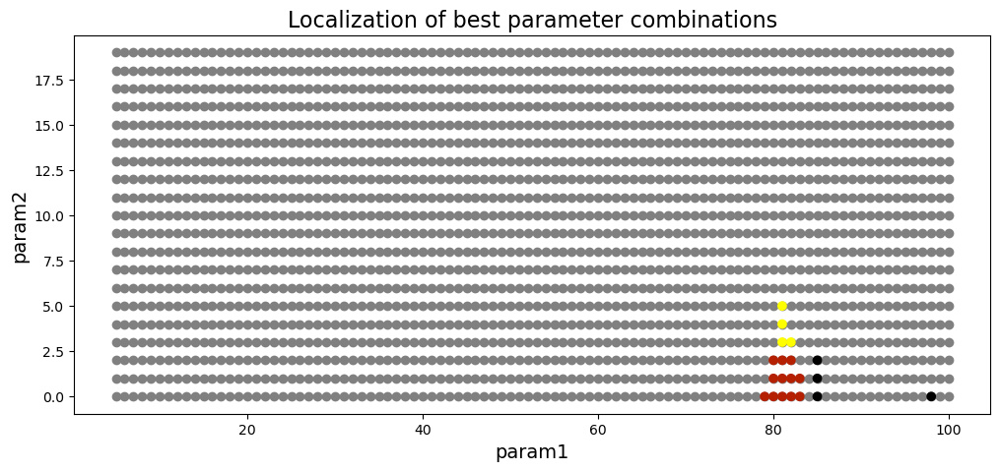

In [55]:
from sklearn.cluster import SpectralClustering

# Separating the lookback values of the best labels in clusters
model2 = SpectralClustering(n_clusters=3, gamma=0.1)
labels2 = model2.fit_predict(best_params)

# Set figure size
plt.figure(figsize=(12, 5))

# Plotting the clusters (this one is to be used when extracting the 50 best combinations)
plt.scatter(best_params[:, 0], best_params[:, 1], c=labels2, cmap='gnuplot', zorder=10)

# Plot in blue all the combinations tested
plt.plot(np.array(all_params)[:, 0], np.array(all_params)[:, 1], 'go', color='grey')

# Set the title and axis labels
plt.title('Localization of best parameter combinations', fontsize=16)
plt.xlabel('param1', fontsize=14)
plt.ylabel('param2', fontsize=14)

# Display the chart
plt.show();

The best combinations of parameters are globally grouped in clusters, which indicates that there are specific informations in these clusters that brings the combinations inside of them to exhibit the same kind of performances.

This gives confidence in the fact that there should not be an important difference in results by picking one or another combination.

On the contrary, if the combinations had been spread across the space, it would have signified that it was the result of randomness to see those specific combinations among the top 20 performers and that a small change in parameters could well have brought performances at the opposite of the spectrum.

### Pick randomly one combination in each cluster

We don't select the best in sample combination because it is unlikely that it will also be the best out of sample.

But by randomly picking one combination in each cluster we improve our chance to get a performance who is the average of the performances of all the combinations in these clusters.

In [57]:
# Loop through the different clusters of combinations and select randomly one combination in each cluster

np.random.seed(18)

indexes_selected = []
for lbl in np.unique(labels2):

    # Find the indices for a particular label
    idx = np.where(labels2 == lbl)

    # Select one sample from the set of indices
    idx_selected = np.random.choice(idx[0], 1)[0]
    indexes_selected.append(idx_selected)
    
print(indexes_selected)

[15, 3, 11]


In [58]:
#to be used when selecting 5% of best combinations
params_to_trade = best_params[indexes_selected]

#params_to_trade[0, 1]
params_to_trade

array([[98,  0],
       [80,  1],
       [81,  4]])

## Cross-validation 

### Test the selected combinations and see how they perform as an equally weighted portfolio on training data

In [62]:
best1_is = build_example_strategy(SimpleNamespace(prices_df=is_df,\
                                                  timestamp=timestamps_is,\
                                                  symbols=selected_tickers,\
                                                  lb=params_to_trade[0,0],\
                                                  threshold=params_to_trade[0,1]))

In [63]:
best2_is = build_example_strategy(SimpleNamespace(prices_df=is_df,\
                                                  timestamp=timestamps_is,\
                                                  symbols=selected_tickers,\
                                                  lb=params_to_trade[1,0],\
                                                  threshold=params_to_trade[1,1]))

In [64]:
best3_is = build_example_strategy(SimpleNamespace(prices_df=is_df,\
                                                  timestamp=timestamps_is,\
                                                  symbols=selected_tickers,\
                                                  lb=params_to_trade[2,0],\
                                                  threshold=params_to_trade[2,1]))

In [65]:
portfolio_is = pq.Portfolio()
portfolio_is.add_strategy('best1_is', best1_is)
portfolio_is.add_strategy('best2_is', best2_is)
portfolio_is.add_strategy('best3_is', best3_is)

portfolio_is.run()

[2023-07-10 13:42:25.399 run_indicators] running strategy indicators: best1_is
[2023-07-10 13:42:25.400 run_indicators] running strategy indicators: best2_is
[2023-07-10 13:42:25.401 run_indicators] running strategy indicators: best3_is
[2023-07-10 13:42:25.401 run_signals] running signals: best1_is
[2023-07-10 13:42:25.408 run_signals] running signals: best2_is
[2023-07-10 13:42:25.412 run_signals] running signals: best3_is
[2023-07-10 13:42:25.418 run_rules] generating order iterations: NaT NaT


,gmean,amean,std,shrp,srt,k,calmar,mar,mdd_pct,mdd_dates,dd_3y_pct,dd_3y_timestamps,up_dwn,2006,2007,2008,2009,2010,2011,2012,2013,2014
,0.1102,0.112,0.007644,0.9233,1.442,0.615,1.679,0.5948,0.1884,2008-06-17/2009-07-08,0.07054,2014-03-05/2014-04-15,1162/935/0.554,0.0125,0.1874,-0.08633,0.2886,0.2884,-0.02997,0.0636,0.2927,0.04279


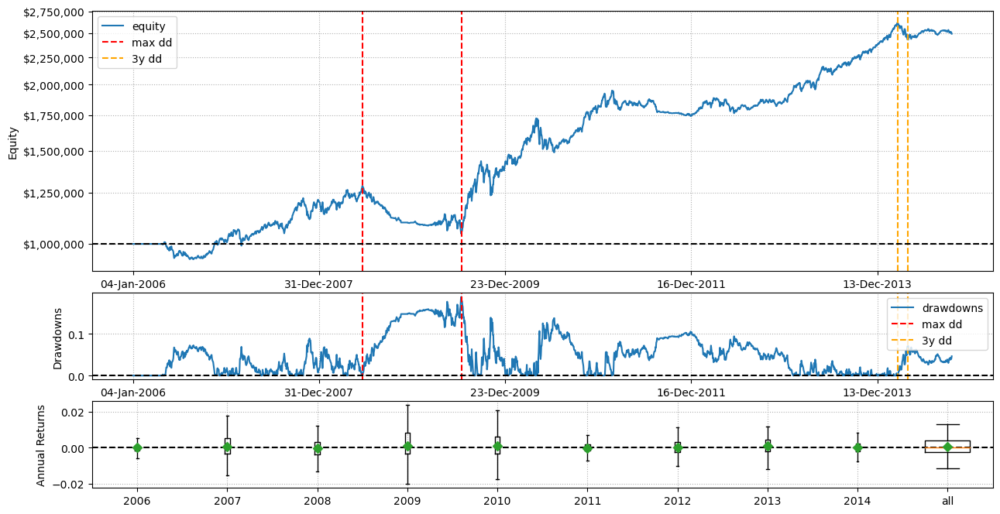

In [66]:
portfolio_is.evaluate_returns();

The portfolio is making money with an acceptable sharpe in sample.

Anyway, the performance of this particular strategy doesn't have much importance since our goal is to combine it with other strategies to build a portfolio of uncorrelated strategies.

Our goal is more about being assured that the strategy is robust and that we could expect the same kind of performance in the future

In [67]:
portfolio_is.df_returns()

,timestamp,best1_is,best2_is,best3_is,equity,ret
0,2006-01-03,333333.333,333333.333,333333.333,999999.999,NaN
1,2006-01-04,333333.333,333333.333,333333.333,999999.999,0
2,2006-01-05,333333.333,333333.333,333333.333,999999.999,0
3,2006-01-06,333333.333,333333.333,333333.333,999999.999,0
4,2006-01-09,333333.333,333333.333,333333.333,999999.999,0
...,...,...,...,...,...,...
2197,2014-09-25,869896.959,823368.335,810091.253,2503356.55,-0.00509335131
2198,2014-09-26,875250.693,825928.429,812416.818,2513595.94,0.00409026526
2199,2014-09-29,875382.97,826157.183,812629.323,2514169.48,0.000228174081
2200,2014-09-30,873048.786,824551.483,811419.018,2509019.29,-0.00204846555


### Test the selected combinations and see how they perform as an equally weighted portfolio on test data

In [12]:
best1_oos = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[0,0],\
                                                   threshold=params_to_trade[0,1]))


'\nbest1_oos = build_example_strategy(SimpleNamespace(prices_df=oos_df,                                                   timestamp=timestamps_oos,                                                   symbols=selected_tickers,                                                   lb=params_to_trade[0,0],                                                   threshold=params_to_trade[0,1]))\n'

In [13]:
best2_oos = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[1,0],\
                                                   threshold=params_to_trade[1,1]))

In [14]:
best3_oos = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[2,0],\
                                                   threshold=params_to_trade[2,1]))

'\nbest3_oos = build_example_strategy(SimpleNamespace(prices_df=oos_df,                                                   timestamp=timestamps_oos,                                                   symbols=selected_tickers,                                                   lb=params_to_trade[2,0],                                                   threshold=params_to_trade[2,1]))\n'

In [71]:
portfolio_oos = pq.Portfolio()
portfolio_oos.add_strategy('best1_oos', best1_oos)
portfolio_oos.add_strategy('best2_oos', best2_oos)
portfolio_oos.add_strategy('best3_oos', best3_oos)

portfolio_oos.run()

[2023-07-10 13:43:53.798 run_indicators] running strategy indicators: best1_oos
[2023-07-10 13:43:53.799 run_indicators] running strategy indicators: best2_oos
[2023-07-10 13:43:53.799 run_indicators] running strategy indicators: best3_oos
[2023-07-10 13:43:53.800 run_signals] running signals: best1_oos
[2023-07-10 13:43:53.807 run_signals] running signals: best2_oos
[2023-07-10 13:43:53.812 run_signals] running signals: best3_oos
[2023-07-10 13:43:53.817 run_rules] generating order iterations: NaT NaT


,gmean,amean,std,shrp,srt,k,calmar,mar,mdd_pct,mdd_dates,dd_3y_pct,dd_3y_timestamps,up_dwn,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
,0.07552,0.07709,0.005699,0.8521,1.303,0.6074,1.044,0.6383,0.1208,2018-09-27/2020-03-16,0.08316,2021-11-16/2022-10-14,1156/958/0.547,0,-0.0147,0.171,0.2459,0.05432,0.02519,0.1072,0.1195,-0.05707,0.09847


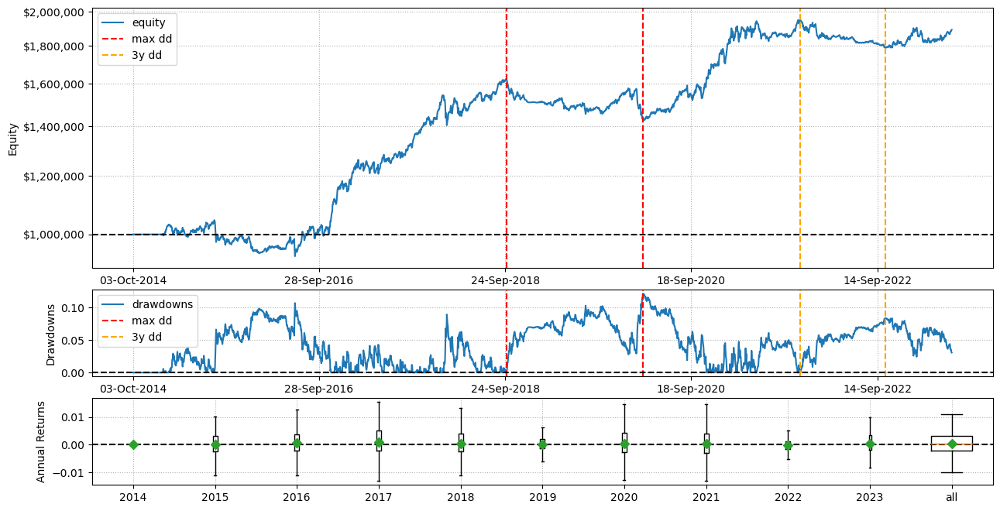

In [72]:
portfolio_oos.evaluate_returns();

Even though there is alpha decay, the portfolio continues to perform decently out of sample

The most important thing is that it doesn't behave totally differently than in sample



## Check if the 20 best combinations from the best clusters behave similarly to the randomly selected combinations on the testing set

I definitely need to build a function for the below code.

However I was lacking time and since the purpose of this notebook was to demonstrate a process more than an ability to build efficient code, it is not an issue for the moment.

However, I will update the notebook on Github once the function is built

In [12]:
selected1 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[0,0],\
                                                   threshold=params_to_trade[0,1]))


selected2 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[1,0],\
                                                   threshold=params_to_trade[1,1]))


selected3 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                   timestamp=timestamps_oos,\
                                                   symbols=selected_tickers,\
                                                   lb=params_to_trade[2,0],\
                                                   threshold=params_to_trade[2,1]))


selected1.run()
selected2.run()
selected3.run()

'\nselected1 = build_example_strategy(SimpleNamespace(prices_df=oos_df,                                                   timestamp=timestamps_oos,                                                   symbols=selected_tickers,                                                   lb=params_to_trade[0,0],                                                   threshold=params_to_trade[0,1]))\n\n\nselected2 = build_example_strategy(SimpleNamespace(prices_df=oos_df,                                                   timestamp=timestamps_oos,                                                   symbols=selected_tickers,                                                   lb=params_to_trade[1,0],                                                   threshold=params_to_trade[1,1]))\n\n\nselected3 = build_example_strategy(SimpleNamespace(prices_df=oos_df,                                                   timestamp=timestamps_oos,                                                   symbols=selected_tickers,         

In [13]:
rets_selected1 = selected1.df_returns()
rets_selected2 = selected2.df_returns()
rets_selected3 = selected3.df_returns()

rets_selected1['ret'].to_csv('rets1_alpha1')
rets_selected2['ret'].to_csv('rets2_alpha1')
rets_selected3['ret'].to_csv('rets3_alpha1')

In [97]:
strat_best1 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[0,0],\
                                                     threshold=best_params[0,1]))

strat_best2 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[1,0],\
                                                     threshold=best_params[1,1]))

strat_best3 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[2,0],\
                                                     threshold=best_params[2,1]))

strat_best4 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[3,0],\
                                                     threshold=best_params[3,1]))

strat_best5 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[4,0],\
                                                     threshold=best_params[4,1]))

strat_best6 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[5,0],\
                                                     threshold=best_params[5,1]))

strat_best7 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[6,0],\
                                                     threshold=best_params[6,1]))

strat_best8 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[7,0],\
                                                     threshold=best_params[7,1]))

strat_best9 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[8,0],\
                                                     threshold=best_params[8,1]))

strat_best10 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[9,0],\
                                                     threshold=best_params[9,1]))

strat_best11 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[10,0],\
                                                     threshold=best_params[10,1]))

strat_best12 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[11,0],\
                                                     threshold=best_params[11,1]))

strat_best13 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[12,0],\
                                                     threshold=best_params[12,1]))

strat_best14 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[13,0],\
                                                     threshold=best_params[13,1]))

strat_best15 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[14,0],\
                                                     threshold=best_params[14,1]))

strat_best16 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[15,0],\
                                                     threshold=best_params[15,1]))

strat_best17 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[16,0],\
                                                     threshold=best_params[16,1]))

strat_best18 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[17,0],\
                                                     threshold=best_params[17,1]))

strat_best19 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[18,0],\
                                                     threshold=best_params[18,1]))

strat_best20 = build_example_strategy(SimpleNamespace(prices_df=oos_df,\
                                                     timestamp=timestamps_oos,\
                                                     symbols=selected_tickers,\
                                                     lb=best_params[19,0],\
                                                     threshold=best_params[19,1]))



strat_best1.run()
strat_best2.run()
strat_best3.run()
strat_best4.run()
strat_best5.run()
strat_best6.run()
strat_best7.run()
strat_best8.run()
strat_best9.run()
strat_best10.run()
strat_best11.run()
strat_best12.run()
strat_best13.run()
strat_best14.run()
strat_best15.run()
strat_best16.run()
strat_best17.run()
strat_best18.run()
strat_best19.run()
strat_best20.run()

In [98]:
# Extract the returns of each combination

select1 = selected1.df_returns()
select2 = selected2.df_returns()
select3 = selected3.df_returns()


best1 = strat_best1.df_returns()
best2 = strat_best2.df_returns()
best3 = strat_best3.df_returns()
best4 = strat_best4.df_returns()
best5 = strat_best5.df_returns()
best6 = strat_best6.df_returns()
best7 = strat_best7.df_returns()
best8 = strat_best8.df_returns()
best9 = strat_best9.df_returns()
best10 = strat_best10.df_returns()
best11 = strat_best11.df_returns()
best12 = strat_best12.df_returns()
best13 = strat_best13.df_returns()
best14 = strat_best14.df_returns()
best15 = strat_best15.df_returns()
best16 = strat_best16.df_returns()
best17 = strat_best17.df_returns()
best18 = strat_best18.df_returns()
best19 = strat_best19.df_returns()
best20 = strat_best20.df_returns()

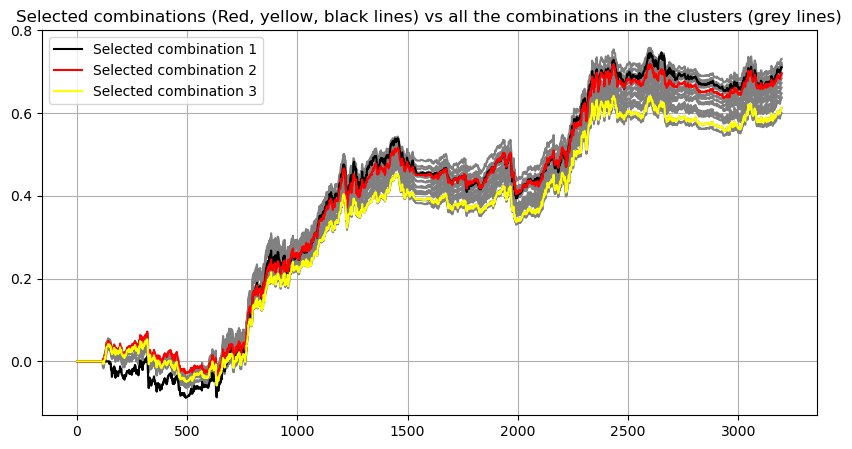

In [99]:
# Plot the equity curve of each combination

plt.figure(figsize=(10,5))
plt.grid()

plt.plot(best2.ret.cumsum(),color='grey')
plt.plot(best3.ret.cumsum(),color='grey')
plt.plot(best4.ret.cumsum(),color='grey')
plt.plot(best5.ret.cumsum(),color='grey')
plt.plot(best6.ret.cumsum(),color='grey')
plt.plot(best7.ret.cumsum(),color='grey')
plt.plot(best8.ret.cumsum(),color='grey')
plt.plot(best9.ret.cumsum(),color='grey')
plt.plot(best10.ret.cumsum(),color='grey')
plt.plot(best11.ret.cumsum(),color='grey')
plt.plot(best12.ret.cumsum(),color='grey')
plt.plot(best13.ret.cumsum(),color='grey')
plt.plot(best14.ret.cumsum(),color='grey')
plt.plot(best15.ret.cumsum(),color='grey')
plt.plot(best16.ret.cumsum(),color='grey')
plt.plot(best17.ret.cumsum(),color='grey')
plt.plot(best18.ret.cumsum(),color='grey')
plt.plot(best19.ret.cumsum(),color='grey')
plt.plot(best20.ret.cumsum(),color='grey')

plt.plot(select1.ret.cumsum(), color='black', label='Selected combination 1')
plt.plot(select2.ret.cumsum(), color='red', label='Selected combination 2')
plt.plot(select3.ret.cumsum(), color='yellow', label='Selected combination 3')
plt.title('Selected combinations (Red, yellow, black lines) vs all the combinations in the clusters (grey lines)')
plt.legend();

Performances of the 20 best combinations deliver more or less similar performances than the 3 combinations we have selected

The strategy is robust to small changes in combinations of parameters

## Test statistical significance (Generate bootstrapped samples from the out of sample returns timeseries)

### Check if the portfolio has a positive PnL at the 95% confidence interval

In [100]:
oos_rets = portfolio_oos.df_returns()
oos_rets = oos_rets.ret
oos_rets

0                  NaN
1                    0
2                    0
3                    0
4                    0
             ...      
2197       0.007637793
2198     0.00130907553
2199   -0.000307715602
2200     0.00429815502
2201    0.000739488769
Name: ret, Length: 2202, dtype: float64

Portfolio total return: 0.67 Bootstrap mean total return: 0.68


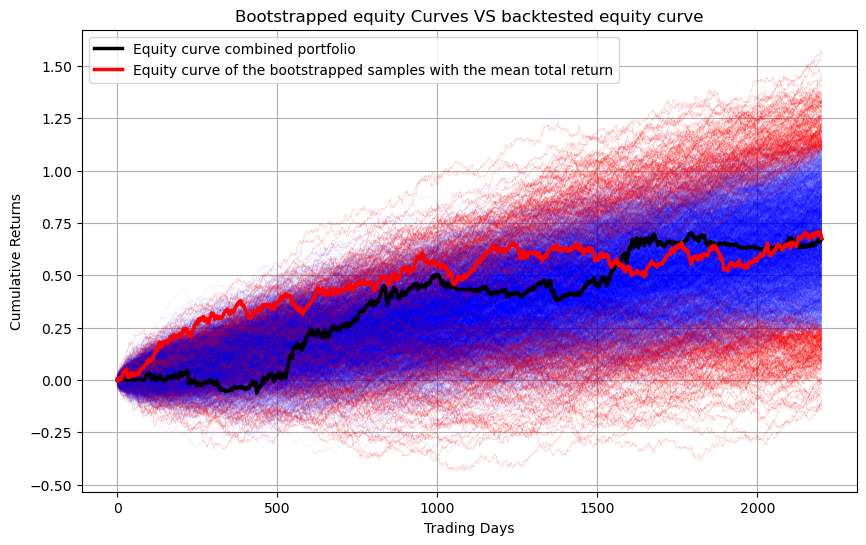

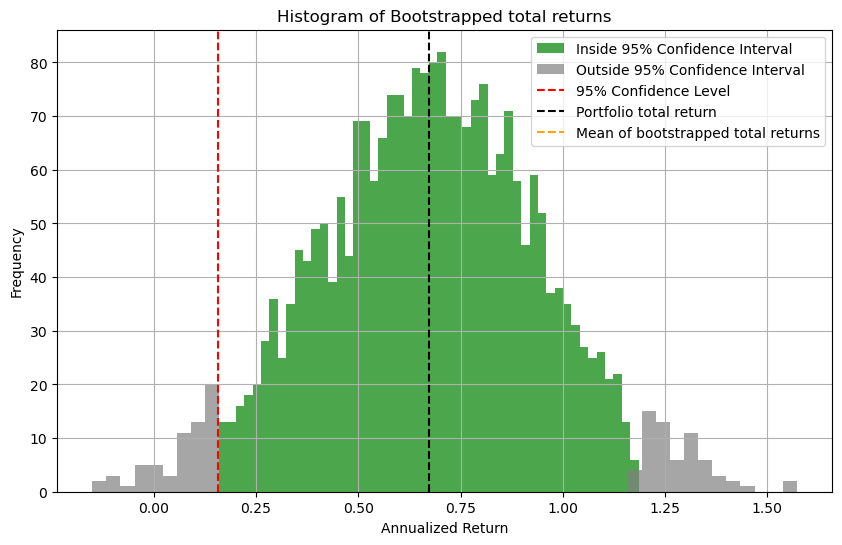

In [104]:
# Set the number of bootstrapped samples
n_samples = 2500

def compute_total_return(returns):
    tr = np.nancumsum(returns)[-1]
    return tr

# Generate random indices for the bootstrapped samples
indices = np.random.randint(low=0, high=len(oos_rets), size=(n_samples, len(oos_rets)))

# Compute the total return and equity curve for each bootstrapped sample
total_return_samples = np.zeros(n_samples)
equity_curve_samples = np.zeros((n_samples, len(oos_rets)))
for i in range(n_samples):
    sample_returns = oos_rets[indices[i]]
    total_return_samples[i] = compute_total_return(sample_returns)
    equity_curve_samples[i] = np.cumsum(sample_returns)

# Compute the mean and standard deviation of the bootstrapped total returns
mean_annual_return = np.mean(total_return_samples)
std_annual_return = np.std(total_return_samples)

# Compute the index of the bootstrapped sample with the mean total return
mean_total_return_index = np.argmin(np.abs(total_return_samples - np.mean(total_return_samples)))

# Compute the equity curve for the bootstrap sample with the mean total return
mean_equity_curve = equity_curve_samples[mean_total_return_index]

# Compute the total return of the strategy
initial_total_return = compute_total_return(oos_rets)

# Plot the equity curves
plt.figure(figsize=(10, 6))
for i in range(n_samples):
    if np.percentile(total_return_samples, 5) <= total_return_samples[i] <= np.percentile(total_return_samples, 95):
        plt.plot(equity_curve_samples[i], alpha=0.05, color='blue', linewidth=0.5)
    else:
        plt.plot(equity_curve_samples[i], alpha=0.2, color='red', linewidth=0.5)

plt.plot(np.nancumsum(oos_rets), label='Equity curve combined portfolio', color='black', linewidth=2.5)
plt.plot(mean_equity_curve, label='Equity curve of the bootstrapped samples with the mean total return', color='red', linewidth=2.5)

plt.legend(loc='upper left')
plt.title('Bootstrapped equity Curves VS backtested equity curve')
plt.xlabel('Trading Days')
plt.ylabel('Cumulative Returns')
print('Portfolio total return:', initial_total_return.round(2), 'Bootstrap mean total return:', mean_equity_curve[-1].round(2))
plt.grid()
plt.show();








# Compute the total return of our strategy
initial_total_return = compute_total_return(oos_rets)

# Plot the histogram of bootstrapped total returns
plt.figure(figsize=(10, 6))

# Plot the bins inside the 95% confidence interval in blue
plt.hist(total_return_samples[(total_return_samples >= np.percentile(total_return_samples, 2.5)) & (total_return_samples <= np.percentile(total_return_samples, 97.5))],
         bins=50, alpha=0.7, color='green', label='Inside 95% Confidence Interval')

# Plot the bins outside the 95% confidence interval in gray
plt.hist(total_return_samples[(total_return_samples < np.percentile(total_return_samples, 2.5)) | (total_return_samples > np.percentile(total_return_samples, 97.5))],
         bins=50, alpha=0.7, color='gray', label='Outside 95% Confidence Interval')

# Plot the vertical lines for the total return at the 95% confidence level, initial strategy return, and mean of bootstrapped total returns
plt.axvline(np.percentile(total_return_samples, 2.5), color='red', linestyle='dashed', linewidth=1.5, label='95% Confidence Level')
plt.axvline(initial_total_return, color='black', linestyle='dashed', linewidth=1.5, label='Portfolio total return')
plt.axvline(np.mean(equity_curve_samples[:, -1]), color='orange', linestyle='dashed', linewidth=1.5, label='Mean of bootstrapped total returns')

# Store the total return corresponding to the 95% confidence level
conf_level_return = np.percentile(total_return_samples, 2.5)
#print(f'Total return at the 95% confidence level: {conf_level_return:.2%}')

plt.legend()
plt.xlabel('Annualized Return')
plt.ylabel('Frequency')
plt.title('Histogram of Bootstrapped total returns')
plt.grid()
plt.show();

The portfolio is performing approximately as well as the mean of the bootstrapped curves which is a good point.

On the contrary, it would have been dangerous if the portfolio performance had been in the top of the bootstrapped curves, and if the mean of the bootstrapped performances had been at or below 0, because it would have signified that the performance in the futur could have been most likely less than what the backtest produced and the less in this case would have been 0 or below.

The portfolio has a positive PnL more than 95% of the time, which is also a good point.

### Check if the portfolio beats the benchmark's sharpe at the 95% confidence interval 

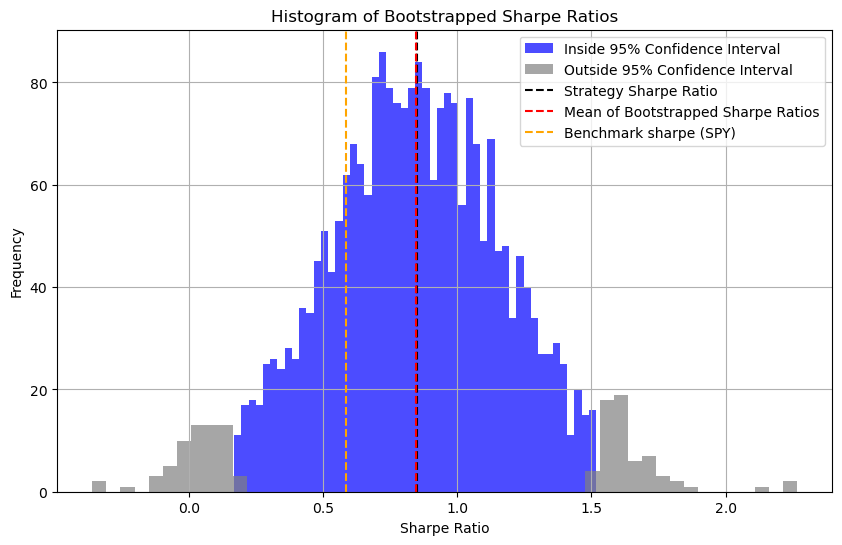

In [102]:
# Set the number of bootstrapped samples
n_samples = 2500

def compute_total_return(returns):
    tr = np.nancumsum(returns)[-1]
    return tr

def compute_sharpe_ratio(returns):
    # Assuming daily returns, 252 is the number of trading days in a year
    avg_daily_return = np.nanmean(returns)
    std_daily_return = np.nanstd(returns)
    sharpe_ratio = avg_daily_return / std_daily_return * np.sqrt(252)
    return sharpe_ratio

# Generate random indices for the bootstrapped samples
indices = np.random.randint(low=0, high=len(oos_rets), size=(n_samples, len(oos_rets)))

# Compute the Sharpe ratio for each bootstrapped sample
sharpe_ratio_samples = np.zeros(n_samples)
for i in range(n_samples):
    sample_returns = oos_rets[indices[i]]
    sharpe_ratio_samples[i] = compute_sharpe_ratio(sample_returns)

# Compute the mean and standard deviation of the bootstrapped Sharpe ratios
mean_sharpe_ratio = np.mean(sharpe_ratio_samples)
std_sharpe_ratio = np.std(sharpe_ratio_samples)

# Compute the Sharpe ratio of the strategy
initial_sharpe_ratio = compute_sharpe_ratio(oos_rets)

# Compute the 95% confidence interval for the Sharpe ratios
lower_bound = np.percentile(sharpe_ratio_samples, 2.5)
upper_bound = np.percentile(sharpe_ratio_samples, 97.5)

# Plot the histogram of bootstrapped Sharpe ratios
plt.figure(figsize=(10, 6))

# Plot the bins inside the 95% confidence interval in blue
plt.hist(sharpe_ratio_samples[(sharpe_ratio_samples >= lower_bound) & (sharpe_ratio_samples <= upper_bound)],
         bins=50, alpha=0.7, color='blue', label='Inside 95% Confidence Interval')

# Plot the bins outside the 95% confidence interval in gray
plt.hist(sharpe_ratio_samples[(sharpe_ratio_samples < lower_bound) | (sharpe_ratio_samples > upper_bound)],
         bins=50, alpha=0.7, color='gray', label='Outside 95% Confidence Interval')

# Plot the vertical lines for the Sharpe ratio of the initial strategy and the mean of bootstrapped Sharpe ratios
plt.axvline(initial_sharpe_ratio, color='black', linestyle='dashed', linewidth=1.5, label='Strategy Sharpe Ratio')
plt.axvline(mean_sharpe_ratio, color='red', linestyle='dashed', linewidth=1.5, label='Mean of Bootstrapped Sharpe Ratios')
plt.axvline(x=0.586, color='orange', linestyle='--', label='Benchmark sharpe (SPY)')

plt.legend()
plt.xlabel('Sharpe Ratio')
plt.ylabel('Frequency')
plt.title('Histogram of Bootstrapped Sharpe Ratios')
plt.grid()
plt.show();

The portfolio of combinations has a sharpe approximately as high as the mean of the bootstrapped sharpes, which is a good point

The selected combination doesn't outperform the sharpe of the benchmark more than 95% of the time.

However, this is not important at this stage of the process since our goal is to build a portfolio of uncorrelated alphas and we will need to beat the benchmark's sharpe at least 95% of the time at the portfolio level, not at the strategy level

### Check the potential shortfall of the maximum drawdown

Actual max drawdown: 0.1251
Mean max drawdown: 0.2104
95% CI of max drawdown: (0.3570)


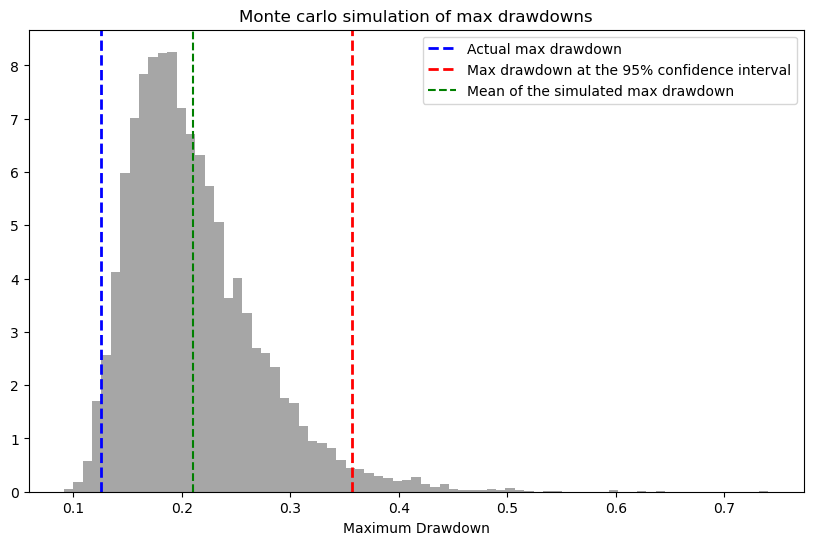

In [106]:
plt.figure(figsize=(10, 6))

# Run Monte Carlo simulation
n_simulations = 10000
max_drawdowns = []
for i in range(n_simulations):
    daily_returns = np.random.normal(0.001, 0.01, len(oos_rets))
    cum_simple_rets = np.nancumsum(daily_returns)
    cum_max_rets = np.maximum.accumulate(cum_simple_rets)
    drawdowns = cum_max_rets - cum_simple_rets
    max_drawdownn = np.max(drawdowns)
    max_drawdowns.append(max_drawdownn)
    
# Define calculated MDD of the strategy


# Plot histogram of max drawdowns
mean_drawdown = np.mean(max_drawdowns)
plt.hist(max_drawdowns, bins=75, density=True, alpha=0.7, color='gray')

def MDD(oos_rets):
    cum_simple_rets = np.nancumsum(oos_rets)
    cum_max_rets = np.maximum.accumulate(cum_simple_rets)
    drawdowns = cum_max_rets - cum_simple_rets
    max_drawdown = np.max(drawdowns)
    return max_drawdown

max_drawdown = MDD(oos_rets)

# Calculate 95% confidence interval
conf_int = np.percentile(max_drawdowns, [2.5, 97.5])

# Print mean and 95% confidence interval of simulated drawdowns
print(f"Actual max drawdown: {max_drawdown:.4f}")
print(f"Mean max drawdown: {mean_drawdown:.4f}")
print(f"95% CI of max drawdown: ({conf_int[1]:.4f})")

# Plot vertical line for 95% confidence interval
#plt.axvline(x=conf_int[0], color='red', linestyle='--', linewidth=2)
plt.axvline(x=max_drawdown, color='blue', linestyle='--', linewidth=2, label='Actual max drawdown')
plt.axvline(x=conf_int[1], color='red', linestyle='--', linewidth=2, label='Max drawdown at the 95% confidence interval')
plt.axvline(x=mean_drawdown, color='g', linestyle='--', label='Mean of the simulated max drawdown')

# Add labels and title
plt.title('Monte carlo simulation of max drawdowns')
plt.xlabel('Maximum Drawdown')
plt.legend();

The backtested maximum drawdown is inferior to the mean of the monte carlo simulation which indicates that we are most likely to see a max drawdown of -21% in live trading than a maximum drawdown of only -12.5%.

This plot shows also that 95% of the time, we will see a max drawdown inferior to 35.7%


# Performances on test set (equity curve + metrics)

,gmean,amean,std,shrp,srt,k,calmar,mar,mdd_pct,mdd_dates,dd_3y_pct,dd_3y_timestamps,up_dwn,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
,0.07552,0.07709,0.005699,0.8521,1.303,0.6074,1.044,0.6383,0.1208,2018-09-27/2020-03-16,0.08316,2021-11-16/2022-10-14,1156/958/0.547,0,-0.0147,0.171,0.2459,0.05432,0.02519,0.1072,0.1195,-0.05707,0.09847


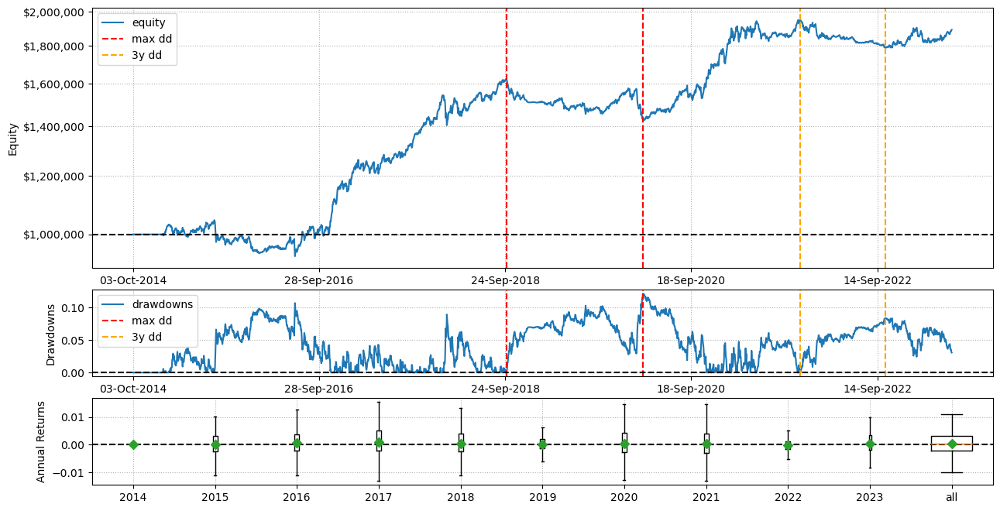

In [103]:
portfolio_oos.evaluate_returns();

# Conclusion

This alpha is robust.

Even though it doesn't beat the benchmark's sharpe ratio at least 95% of the time, this alpha could potentially add value to our portfolio.

=> Check if this strategy can anyway add value to the portfolio by way of diversification

# Another kind of bootstrapping

In [ ]:
'''
# Define the number of folds and the length of each fold
num_folds = 1000
fold_length = 252

# Get the length of the original dataset
data_length = len(oos_df)

# Generate random start indices for each fold
start_indices = np.random.randint(0, data_length - fold_length, size=num_folds)

# Create an empty list to store the folds
foldz = []

# Create the folds
for start_index in start_indices:
    end_index = start_index + fold_length
    fold_data = oos_df.iloc[start_index:end_index].copy()
    foldz.append(fold_data)

# Print the first few rows of each fold
for fold_index, fold_data in enumerate(foldz):
    print(f"Fold {fold_index + 1}:")
    print(fold_data)
    print("------------------")
'''

In [ ]:
'''
def brac_test(folds, tickers, s1p1, s1p2, s2p1, s2p2, s3p1, s3p2, build_example_strategy):
    
    sharpes = []
    rets = []

    for f in folds:
    
        test1 = build_example_strategy(SimpleNamespace(prices_df=f,\
                                                      timestamp=f.index.values,\
                                                      symbols=tickers,\
                                                      rsi_in=s1p1,\
                                                      rsi_out=s1p2))
        
        test2 = build_example_strategy(SimpleNamespace(prices_df=f,\
                                                      timestamp=f.index.values,\
                                                      symbols=tickers,\
                                                      rsi_in=s2p1,\
                                                      rsi_out=s2p2))

        test3 = build_example_strategy(SimpleNamespace(prices_df=f,\
                                                      timestamp=f.index.values,\
                                                      symbols=tickers,\
                                                      rsi_in=s3p1,\
                                                      rsi_out=s3p2))
        
        
        
        portfolio = pq.Portfolio()
        portfolio.add_strategy('test1', test1)
        portfolio.add_strategy('test2', test2)
        portfolio.add_strategy('test3', test3)
        
        portfolio.run()
        
        data = portfolio.df_returns()
        returns = data.ret
        amean = compute_amean(returns, 252)
        sharpe = compute_sharpe(returns, amean, 252)
        sharpes.append(sharpe)
        rets.append(returns)
        
    return sharpes, rets;
'''

In [19]:
'''
brac = brac_test(foldz, \
                 selected_tickers,\
                 params_to_trade[0,0],\
                 params_to_trade[0,1],\
                 params_to_trade[1,0],\
                 params_to_trade[1,1],\
                 params_to_trade[2,0],\
                 params_to_trade[2,1],\
                 build_example_strategy);
'''

'\nbrac = brac_test(foldz,                  selected_tickers,                 params_to_trade[0,0],                 params_to_trade[0,1],                 params_to_trade[1,0],                 params_to_trade[1,1],                 params_to_trade[2,0],                 params_to_trade[2,1],                 build_example_strategy);\n'

In [ ]:
'''
plt.figure(figsize=(10,5))

# Calculate the 95th and 5th percentiles for the confidence interval
conf_interval = (5, 95)
percentiles = np.percentile(brac[0], conf_interval)

# Plot the histogram
plt.hist(brac[0], bins=100, edgecolor='black')

# Adding labels and title
plt.xlabel('Sharpe Ratio')
plt.ylabel('Frequency')
plt.title('Distribution of Sharpes')

# Calculating the mean
mean_sharpe = np.mean(brac[0])

# Calculate the sharpe of the selected combination
#selected_combination_data = strat_final.df_returns()
#selected_amean = compute_amean(selected_combination_data.ret, 252)
#selected_sharpe = compute_sharpe(selected_combination_data.ret, selected_amean, 252)

sharpe_at_5th_percentile = np.percentile(brac[0], conf_interval[0])

# Adding the mean line
plt.axvline(x=mean_sharpe, color='red', linestyle='--', label='Mean sharpe of the subsets')
#plt.axvline(x=selected_sharpe, color='blue', linestyle='--', label='Sharpe on test data')
plt.axvline(x=0.586, color='black', linestyle='--', label='Benchmark sharpe (SPY)')

# Get the histogram data
n, bins, patches = plt.hist(brac[0], bins=100, edgecolor='black')

# Highlight the bins within the 95% confidence interval
for i in range(len(bins) - 1):
    if percentiles[0] <= bins[i] <= percentiles[1]:
        patches[i].set_facecolor('grey')
        
#print('Selected combination sharpe:             ', selected_sharpe)
#print('')
print('Mean of the bootstrapped sharpes:        ', mean_sharpe)
print('')
print('Benchmark sharpe:                        ', 0.586)
print('')
print(f"Sharpe ratio at the 5th percentile:       {sharpe_at_5th_percentile}")


# Adding a legend
plt.legend()

# Displaying the plot
plt.show();
'''